In [3]:
import os
import pandas as pd
import numpy as np
import math
from matplotlib.pyplot import *
import matplotlib.pyplot as plt
from matplotlib import animation
from matplotlib import cm
from parse import *
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier as RandomForest
import random
from sklearn import linear_model
from datetime import datetime
import gc

pd.set_option("display.max_columns", 2000)


In [4]:
CHUNKSIZE = 100000

TRAIN_DATE        = "train_date.csv"
TRAIN_NUMERIC     = "train_numeric.csv"
TRAIN_CATEGORICAL = "train_categorical.csv"
TEST_DATE         = "test_date.csv"
TEST_NUMERIC      = "test_numeric.csv"
TEST_CATEGORICAL  = "test_categorical.csv"

SEED = 0
CHUNKSIZE = 50000
NROWS = 1200000

ID_COLUMN = 'Id'
TARGET_COLUMN = 'Response'
 

In [22]:
CHUNK_SIZE = 10000

start = datetime.now()

reader_res = pd.read_csv("output/df_id_response.csv",chunksize=CHUNK_SIZE, dtype=np.float32)
reader_cat = pd.read_csv("train_categorical.csv",chunksize=CHUNK_SIZE, encoding='utf-8')

#分割して読み込み
loop = 0
cnt_0 = 0
cnt_1 = 0
for df_chunk_res in reader_res:
    df_chunk_cat = reader_cat.get_chunk(CHUNK_SIZE)
    
    df_chunk = pd.merge(on="Id", left=df_chunk_res, right=df_chunk_cat)
    cnt_0 = cnt_0 + len(df_chunk[df_chunk['Response'] == 0].index)
    cnt_1 = cnt_1 + len(df_chunk[df_chunk['Response'] == 1].index)

    if loop == 0:
        df = df_chunk
    else:
        df = pd.concat([df, df_chunk])
    
    print("loop : {} / Rows = {}".format(loop, len(df.index)))

    loop = loop + 1

    if(loop == 10):
        break
    
print("0:{}, 1:{}".format(cnt_0, cnt_1))
print("{} -> {}".format(start, datetime.now()))
print("Memory:{}".format(df.memory_usage(index=True).sum()))

C:\Users\Takumi\Anaconda3\envs\Kaggle\lib\site-packages\IPython\core\interactiveshell.py:2662: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,41,42,43,57,59,60,62,63,65,66,68,69,71,72,74,75,77,78,80,81,83,84,86,87,89,90,92,93,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,188,189,190,191,192,193,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,335,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,45

loop : 0 / Rows = 10000


C:\Users\Takumi\Anaconda3\envs\Kaggle\lib\site-packages\IPython\core\interactiveshell.py:2662: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,57,59,60,62,63,65,66,68,69,71,72,74,75,77,78,80,81,83,84,86,87,89,90,92,93,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,324,335,337,340,342,344,346,348,351,354,357,360,363,366,369,372,375,378,381,384,387,390,393,396,399,402,407,410,413,416,419,422,425,428,431,434,437,440,443,446,449,452,455,458,461,464,467,470,473,476,479,482,485,488,491,494,497,500,503,506,509,512,515,518,549,576,587,588,589,590,591,592,593,594,595,596,597,611,614,617,620,623,626,629,632,635,638,641,644,647,650,653,656,659,662,665,668,671,674,677,680,683,686,689,692,695,698,701,704,707,710,713,716,719,722,780,807,809,811,813,815,817,820,823,826,829,832,835,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862

loop : 1 / Rows = 20000


C:\Users\Takumi\Anaconda3\envs\Kaggle\lib\site-packages\IPython\core\interactiveshell.py:2662: DtypeWarning: Columns (5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,324,335,337,340,342,344,346,348,351,354,357,360,363,366,369,372,375,378,381,384,387,390,393,396,399,402,407,410,413,416,419,422,425,428,431,434,437,440,443,446,449,452,455,458,461,464,467,470,473,476,479,482,485,488,491,494,497,500,503,506,509,512,515,518,549,576,587,588,589,590,591,592,593,594,595,596,597,611,614,617,620,623,626,629,632,635,638,641,644,647,650,653,656,659,662,665,

loop : 2 / Rows = 30000


C:\Users\Takumi\Anaconda3\envs\Kaggle\lib\site-packages\IPython\core\interactiveshell.py:2662: DtypeWarning: Columns (5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,41,42,43,44,45,46,57,59,60,62,63,65,66,68,69,71,72,74,75,77,78,80,81,83,84,86,87,89,90,92,93,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,188,190,191,193,324,335,337,340,342,344,346,348,351,354,357,360,363,366,369,372,375,378,381,384,387,390,393,396,399,402,407,410,413,416,419,422,425,428,431,434,437,440,443,446,449,452,455,458,461,464,467,470,473,476,479,482,485,488,491,494,497,500,503,506,509,512,515,518,549,576,587,588,589,590,591,592,593,594,595,596,597,611,614,617,620,623,626,629,632,635,638,641,644,647,650,653,656,659,662,665,668,671,674,677,680,683,686,689,692,695,698,701,704,707,710,713,716,719,722,780,842,844,845,847,848,850,851,853,8

loop : 3 / Rows = 40000


C:\Users\Takumi\Anaconda3\envs\Kaggle\lib\site-packages\IPython\core\interactiveshell.py:2662: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,41,43,44,46,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,324,335,337,340,342,344,346,348,351,354,357,360,363,366,369,372,375,378,381,384,387,390,393,396,399,402,407,410,413,416,419,422,425,428,431,434,437,440,443,446,449,452,455,458,461,464,

loop : 4 / Rows = 50000


C:\Users\Takumi\Anaconda3\envs\Kaggle\lib\site-packages\IPython\core\interactiveshell.py:2662: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,41,42,43,44,45,46,57,59,60,62,63,65,66,68,69,71,72,74,75,77,78,80,81,83,84,86,87,89,90,92,93,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,204,206,210,212,216,218,324,335,337,340,342,344,346,348,351,354,357,360,363,366,369,372,375,378,381,384,387,390,393,396,399,402,407,410,413,416,419,422,425,428,431,434,437,440,443,446,449,452,455,458,461,464,467,470,473,476,479,482,485,488,491,494,497,500,503,506,509,512,515,518,549,597,611,614,617,620,623,626,629,632,635,638,641,644,647,650,653,656,659,662,665,668,671,674,677,680,683,686,689,692,695,698,701,704,707,710,713,716,719,722,900,903,906,909,912,915,918,921,924,927,930,933,936,939,942,945,9

loop : 5 / Rows = 60000


C:\Users\Takumi\Anaconda3\envs\Kaggle\lib\site-packages\IPython\core\interactiveshell.py:2662: DtypeWarning: Columns (5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,41,42,43,57,59,60,62,63,65,66,68,69,71,72,74,75,77,78,80,81,83,84,86,87,89,90,92,93,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,188,190,191,193,324,335,337,340,342,344,346,348,351,354,357,360,363,366,369,372,375,378,381,384,387,390,393,396,399,402,407,410,413,416,419,422,425,428,431,434,437,440,443,446,449,452,455,458,461,464,467,470,473,476,479,482,485,488,491,494,497,500,503,506,509,512,515,518,549,611,614,617,620,623,626,629,632,635,638,641,644,647,650,653,656,659,662,665,668,671,674,677,680,683,686,689,692,695,698,701,704,707,710,713,716,719,722,842,844,845,847,848,850,851,853,854,856,857,859,860,862,863,865,866,868,869,871,872,874,875,877,878,880,881,883,884,886,887,889,890,892,893,895,896,898,900,903,906,90

loop : 6 / Rows = 70000


C:\Users\Takumi\Anaconda3\envs\Kaggle\lib\site-packages\IPython\core\interactiveshell.py:2662: DtypeWarning: Columns (5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,188,190,191,193,204,206,207,209,210,212,213,215,216,218,219,221,222,224,225,227,228,230,231,233,234,236,237,239,240,242,243,245,246,248,249,251,252,254,255,257,258,260,261,263,264,266,267,269,270,272,273,275,276,278,279,281,282,284,285,287,288,290,291,293,324,335,337,340,342,344,346,348,351,354,357,360,363,366,369,372,375,378,381,384,387,390,393,396,399,402,407,410,413,416,419,422,425,428,431,434,437,440,443,446,449,452,455,458,461,464,467,470,473,476,479,482,485,488,491,494,497,500,503,

loop : 7 / Rows = 80000


C:\Users\Takumi\Anaconda3\envs\Kaggle\lib\site-packages\IPython\core\interactiveshell.py:2662: DtypeWarning: Columns (5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,41,43,57,59,60,62,63,65,66,68,69,71,72,74,75,77,78,80,81,83,84,86,87,89,90,92,93,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,335,407,410,413,416,419,422,425,428,431,434,437,440,443,446,449,452,455,458,461,464,467,470,473,476,479,482,485,488,491,494,497,500,503,506,509,512,515,518,668,671,674,677,680,683,686,689,692,695,698,701,704,707,710,713,716,719,722,984,998,1006,1009,1012,1015,1018,1021,1024,1027,1030,1033,1036,1039,1042,1045,1048,1051,1053,1054,1055,1056,1057,1058,1059,1060,1061,1062,1063,1064,1065,1066,1067,1068,1069,1070,1071,1072,1073,1074,1075,1076,1077,1078,1079,1080,1081,1082,1083,1084,1085,1086,1087,1088,1089,1090,1091,1092,1093,1094,1095,1096,1097,1098,1099,1100,1126,1129,1132,1135,1138,1141,1144,11

loop : 8 / Rows = 90000


C:\Users\Takumi\Anaconda3\envs\Kaggle\lib\site-packages\IPython\core\interactiveshell.py:2662: DtypeWarning: Columns (1,2,3,4,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,249,251,252,254,255,257,258,260,261,263,264,266,267,269,270,272,273,275,276,278,279,281,282,284,285,287,288,290,291,293,335,407,410,413,416,419,422,425,428,431,434,437,440,443,446,449,452,455,458,461,464,467,470,473,476,479,482,485,488,491,494,497,500,503,506,509,512,515,518,576,587,588,589,590,591,592,593,594,595,596,597,611,614,617,620,623,626,629,632,635,638,641,644,647,650,653,656,659,662,665,668,671,674,677,680,683,686,689,692,695,698,701,704,707,710,713,716,719,722,780,808,810,812,814,816,818,819,821,822,824,825,827,828,830,831,833,834,836,842,844,845,847,848,850,851,853,854,856,857,859,860,8

loop : 9 / Rows = 100000
0:99432, 1:568
2018-07-15 22:44:27.608168 -> 2018-07-15 22:54:39.825949
Memory:1713600000


In [9]:
df_chunk_cat.head()

Id L0_S1_F25 L0_S1_F27 L0_S1_F29 L0_S1_F31 L0_S2_F33 L0_S2_F35 L0_S2_F37  \
0   4       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1   6       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2   7       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3   9       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
4  11       NaN       NaN       NaN       NaN       NaN       NaN       NaN   

  L0_S2_F39 L0_S2_F41 L0_S2_F43 L0_S2_F45 L0_S2_F47 L0_S2_F49 L0_S2_F51  \
0       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
4       NaN       NaN       NaN       NaN       NaN       NaN       NaN   

  L0_S2_F53 L0_S2_F55 L0_S2_F57 L0_S2_F59 L0_S2_F61 L0_S2_F63 L0_S2_F65  \
0       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
4       NaN       NaN       NaN       NaN       NaN       NaN       NaN   

  L0_S2_F67  L0_S3_F69  L0_S3_F71  L0_S3_F73  L0_S3_F75  L0_S3_F77  L0_S3_F79  \
0       NaN        NaN        NaN        NaN        NaN        NaN        NaN   
1       NaN        NaN        NaN        NaN        NaN        NaN        NaN   
2       NaN        NaN        NaN        NaN        NaN        NaN        NaN   
3       NaN        NaN        NaN        NaN        NaN        NaN        NaN   
4       NaN        NaN        NaN        NaN        NaN        NaN        NaN   

   L0_S3_F81  L0_S3_F83  L0_S3_F85  L0_S3_F87  L0_S3_F89  L0_S3_F91  \
0        NaN        NaN        NaN        NaN        NaN        NaN   
1        NaN        NaN        NaN        NaN        NaN        NaN   
2        NaN        NaN        NaN        NaN        NaN        NaN   
3        NaN        NaN        NaN        NaN        NaN        NaN   
4        NaN        NaN        NaN        NaN        NaN        NaN   

   L0_S3_F93  L0_S3_F95  L0_S3_F97  L0_S3_F99  L0_S3_F101  L0_S3_F103  \
0        NaN        NaN        NaN        NaN         NaN         NaN   
1        NaN        NaN        NaN        NaN         NaN         NaN   
2        NaN        NaN        NaN        NaN         NaN         NaN   
3        NaN        NaN        NaN        NaN         NaN         NaN   
4        NaN        NaN        NaN        NaN         NaN         NaN   

  L0_S4_F105 L0_S4_F107 L0_S4_F108 L0_S4_F110 L0_S4_F112 L0_S4_F113  \
0        NaN        NaN        NaN        NaN        NaN        NaN   
1        NaN        NaN        NaN        NaN        NaN        NaN   
2        NaN        NaN        NaN        NaN        NaN        NaN   
3        NaN        NaN        NaN        NaN        NaN        NaN   
4        NaN        NaN        NaN        NaN        NaN        NaN   

   L0_S6_F119  L0_S6_F121  L0_S6_F123  L0_S6_F125  L0_S6_F126  L0_S6_F128  \
0         NaN         NaN         NaN         NaN         NaN         NaN   
1         NaN         NaN         NaN         NaN         NaN         NaN   
2         NaN         NaN         NaN         NaN         NaN         NaN   
3         NaN         NaN         NaN         NaN         NaN         NaN   
4         NaN         NaN         NaN         NaN         NaN         NaN   

   L0_S6_F129  L0_S6_F131  L0_S6_F133  L0_S6_F135 L0_S9_F151 L0_S9_F153  \
0         NaN         NaN         NaN         NaN        NaN        NaN   
1         NaN         NaN         NaN         NaN        NaN        NaN   
2         NaN         NaN         NaN         NaN        NaN        NaN   
3         NaN         NaN         NaN         NaN        NaN        NaN   
4       

In [3]:
cat = pd.read_csv("train_categorical.csv",encoding='utf-8', nrows=10000)

C:\Users\Takumi\Anaconda3\envs\Kaggle\lib\site-packages\IPython\core\interactiveshell.py:2785: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,41,42,43,57,59,60,62,63,65,66,68,69,71,72,74,75,77,78,80,81,83,84,86,87,89,90,92,93,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,188,189,190,191,192,193,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,335,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,45

In [4]:
cat.head()

Id L0_S1_F25 L0_S1_F27 L0_S1_F29 L0_S1_F31 L0_S2_F33 L0_S2_F35 L0_S2_F37  \
0   4       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1   6       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2   7       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3   9       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
4  11       NaN       NaN       NaN       NaN       NaN       NaN       NaN   

  L0_S2_F39 L0_S2_F41 L0_S2_F43 L0_S2_F45 L0_S2_F47 L0_S2_F49 L0_S2_F51  \
0       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
4       NaN       NaN       NaN       NaN       NaN       NaN       NaN   

  L0_S2_F53 L0_S2_F55 L0_S2_F57 L0_S2_F59 L0_S2_F61 L0_S2_F63 L0_S2_F65  \
0       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
4       NaN       NaN       NaN       NaN       NaN       NaN       NaN   

  L0_S2_F67  L0_S3_F69  L0_S3_F71  L0_S3_F73  L0_S3_F75  L0_S3_F77  L0_S3_F79  \
0       NaN        NaN        NaN        NaN        NaN        NaN        NaN   
1       NaN        NaN        NaN        NaN        NaN        NaN        NaN   
2       NaN        NaN        NaN        NaN        NaN        NaN        NaN   
3       NaN        NaN        NaN        NaN        NaN        NaN        NaN   
4       NaN        NaN        NaN        NaN        NaN        NaN        NaN   

   L0_S3_F81  L0_S3_F83  L0_S3_F85  L0_S3_F87  L0_S3_F89  L0_S3_F91  \
0        NaN        NaN        NaN        NaN        NaN        NaN   
1        NaN        NaN        NaN        NaN        NaN        NaN   
2        NaN        NaN        NaN        NaN        NaN        NaN   
3        NaN        NaN        NaN        NaN        NaN        NaN   
4        NaN        NaN        NaN        NaN        NaN        NaN   

   L0_S3_F93  L0_S3_F95  L0_S3_F97  L0_S3_F99  L0_S3_F101  L0_S3_F103  \
0        NaN        NaN        NaN        NaN         NaN         NaN   
1        NaN        NaN        NaN        NaN         NaN         NaN   
2        NaN        NaN        NaN        NaN         NaN         NaN   
3        NaN        NaN        NaN        NaN         NaN         NaN   
4        NaN        NaN        NaN        NaN         NaN         NaN   

  L0_S4_F105 L0_S4_F107 L0_S4_F108  L0_S4_F110  L0_S4_F112  L0_S4_F113  \
0        NaN        NaN        NaN         NaN         NaN         NaN   
1        NaN        NaN        NaN         NaN         NaN         NaN   
2        NaN        NaN        NaN         NaN         NaN         NaN   
3        NaN        NaN        NaN         NaN         NaN         NaN   
4        NaN        NaN        NaN         NaN         NaN         NaN   

   L0_S6_F119  L0_S6_F121  L0_S6_F123  L0_S6_F125  L0_S6_F126  L0_S6_F128  \
0         NaN         NaN         NaN         NaN         NaN         NaN   
1         NaN         NaN         NaN         NaN         NaN         NaN   
2         NaN         NaN         NaN         NaN         NaN         NaN   
3         NaN         NaN         NaN         NaN         NaN         NaN   
4         NaN         NaN         NaN         NaN         NaN         NaN   

   L0_S6_F129  L0_S6_F131  L0_S6_F133  L0_S6_F135 L0_S9_F151  L0_S9_F153  \
0         NaN         NaN         NaN         NaN        NaN         NaN   
1         NaN         NaN         NaN         NaN        NaN         NaN   
2         NaN         NaN         NaN         NaN        NaN         NaN   
3         NaN         NaN         NaN         NaN        NaN 

In [5]:
cat.shape

(10000, 2141)

In [6]:
num = pd.read_csv("train_numeric.csv",encoding='utf-8', nrows=10000)

In [7]:
num.head()

,Id,L0_S0_F0,L0_S0_F2,L0_S0_F4,L0_S0_F6,L0_S0_F8,L0_S0_F10,L0_S0_F12,L0_S0_F14,L0_S0_F16,L0_S0_F18,L0_S0_F20,L0_S0_F22,L0_S1_F24,L0_S1_F28,L0_S2_F32,L0_S2_F36,L0_S2_F40,L0_S2_F44,L0_S2_F48,L0_S2_F52,L0_S2_F56,L0_S2_F60,L0_S2_F64,L0_S3_F68,L0_S3_F72,L0_S3_F76,L0_S3_F80,L0_S3_F84,L0_S3_F88,L0_S3_F92,L0_S3_F96,L0_S3_F100,L0_S4_F104,L0_S4_F109,L0_S5_F114,L0_S5_F116,L0_S6_F118,L0_S6_F122,L0_S6_F132,L0_S7_F136,L0_S7_F138,L0_S7_F142,L0_S8_F144,L0_S8_F146,L0_S8_F149,L0_S9_F155,L0_S9_F160,L0_S9_F165,L0_S9_F170,L0_S9_F175,L0_S9_F180,L0_S9_F185,L0_S9_F190,L0_S9_F195,L0_S9_F200,L0_S9_F205,L0_S9_F210,L0_S10_F219,L0_S10_F224,L0_S10_F229,L0_S10_F234,L0_S10_F239,L0_S10_F244,L0_S10_F249,L0_S10_F254,L0_S10_F259,L0_S10_F264,L0_S10_F269,L0_S10_F274,L0_S11_F282,L0_S11_F286,L0_S11_F290,L0_S11_F294,L0_S11_F298,L0_S11_F302,L0_S11_F306,L0_S11_F310,L0_S11_F314,L0_S11_F318,L0_S11_F322,L0_S11_F326,L0_S12_F330,L0_S12_F332,L0_S12_F334,L0_S12_F336,L0_S12_F338,L0_S12_F340,L0_S12_F342,L0_S12_F344,L0_S12_F346,L0_S12_F348,L0_S12_F350,L0_S12_F352,L0_S13_F354,L0_S13_F356,L0_S14_F358,L0_S14_F362,L0_S14_F366,L0_S14_F370,L0_S14_F374,L0_S14_F378,L0_S14_F382,L0_S14_F386,L0_S14_F390,L0_S15_F394,L0_S15_F397,L0_S15_F400,L0_S15_F403,L0_S15_F406,L0_S15_F409,L0_S15_F412,L0_S15_F415,L0_S15_F418,L0_S16_F421,L0_S16_F426,L0_S17_F431,L0_S17_F433,L0_S18_F435,L0_S18_F439,L0_S18_F449,L0_S19_F453,L0_S19_F455,L0_S19_F459,L0_S20_F461,L0_S20_F463,L0_S20_F466,L0_S21_F472,L0_S21_F477,L0_S21_F482,L0_S21_F487,L0_S21_F492,L0_S21_F497,L0_S21_F502,L0_S21_F507,L0_S21_F512,L0_S21_F517,L0_S21_F522,L0_S21_F527,L0_S21_F532,L0_S21_F537,L0_S22_F546,L0_S22_F551,L0_S22_F556,L0_S22_F561,L0_S22_F566,L0_S22_F571,L0_S22_F576,L0_S22_F581,L0_S22_F586,L0_S22_F591,L0_S22_F596,L0_S22_F601,L0_S22_F606,L0_S22_F611,L0_S23_F619,L0_S23_F623,L0_S23_F627,L0_S23_F631,L0_S23_F635,L0_S23_F639,L0_S23_F643,L0_S23_F647,L0_S23_F651,L0_S23_F655,L0_S23_F659,L0_S23_F663,L0_S23_F667,L0_S23_F671,L1_S24_F679,L1_S24_F683,L1_S24_F687,L1_S24_F691,L1_S24_F700,L1_S24_F719,L1_S24_F728,L1_S24_F733,L1_S24_F746,L1_S24_F751,L1_S24_F756,L1_S24_F761,L1_S24_F766,L1_S24_F775,L1_S24_F780,L1_S24_F785,L1_S24_F790,L1_S24_F795,L1_S24_F800,L1_S24_F802,L1_S24_F806,L1_S24_F808,L1_S24_F810,L1_S24_F812,L1_S24_F814,L1_S24_F816,L1_S24_F829,L1_S24_F834,L1_S24_F839,L1_S24_F844,L1_S24_F857,L1_S24_F862,L1_S24_F867,L1_S24_F872,L1_S24_F877,L1_S24_F882,L1_S24_F887,L1_S24_F892,L1_S24_F897,L1_S24_F902,L1_S24_F907,L1_S24_F920,L1_S24_F925,L1_S24_F930,L1_S24_F935,L1_S24_F948,L1_S24_F953,L1_S24_F958,L1_S24_F963,L1_S24_F968,L1_S24_F973,L1_S24_F978,L1_S24_F983,L1_S24_F988,L1_S24_F993,L1_S24_F998,L1_S24_F1000,L1_S24_F1002,L1_S24_F1004,L1_S24_F1006,L1_S24_F1008,L1_S24_F1010,L1_S24_F1012,L1_S24_F1014,L1_S24_F1016,L1_S24_F1021,L1_S24_F1026,L1_S24_F1031,L1_S24_F1036,L1_S24_F1041,L1_S24_F1046,L1_S24_F1051,L1_S24_F1056,L1_S24_F1068,L1_S24_F1072,L1_S24_F1079,L1_S24_F1083,L1_S24_F1087,L1_S24_F1094,L1_S24_F1098,L1_S24_F1102,L1_S24_F1106,L1_S24_F1110,L1_S24_F1118,L1_S24_F1122,L1_S24_F1126,L1_S24_F1130,L1_S24_F1134,L1_S24_F1145,L1_S24_F1148,L1_S24_F1161,L1_S24_F1166,L1_S24_F1170,L1_S24_F1172,L1_S24_F1174,L1_S24_F1176,L1_S24_F1180,L1_S24_F1184,L1_S24_F1197,L1_S24_F1202,L1_S24_F1207,L1_S24_F1212,L1_S24_F1225,L1_S24_F1230,L1_S24_F1235,L1_S24_F1240,L1_S24_F1245,L1_S24_F1250,L1_S24_F1255,L1_S24_F1260,L1_S24_F1265,L1_S24_F1270,L1_S24_F1275,L1_S24_F1288,L1_S24_F1293,L1_S24_F1298,L1_S24_F1303,L1_S24_F1316,L1_S24_F1321,L1_S24_F1326,L1_S24_F1331,L1_S24_F1336,L1_S24_F1341,L1_S24_F1346,L1_S24_F1351,L1_S24_F1356,L1_S24_F1361,L1_S24_F1366,L1_S24_F1371,L1_S24_F1376,L1_S24_F1381,L1_S24_F1386,L1_S24_F1391,L1_S24_F1396,L1_S24_F1401,L1_S24_F1406,L1_S24_F1411,L1_S24_F1416,L1_S24_F1421,L1_S24_F1426,L1_S24_F1431,L1_S24_F1436,L1_S24_F1441,L1_S24_F1446,L1_S24_F1451,L1_S24_F1463,L1_S24_F1467,L1_S24_F1474,L1_S24_F1478,L1_S24_F1482,L1_S24_F1486,L1_S24_F1490,L1_S24_F1494,L1_S24_F1498,L1_S24_F1502,L1_S24_F1506,L1_S24_F1512,L1_S24_F1514,L1_S24_F1516,L1_S24_F1518,L1_S24_F1520,L1_S24_F1539,L1_S24_F1544,L1_S24_F15

In [8]:
num.shape

(10000, 970)

In [9]:
date = pd.read_csv("train_date.csv",encoding='utf-8', nrows=10000)

In [10]:
date.head()

,Id,L0_S0_D1,L0_S0_D3,L0_S0_D5,L0_S0_D7,L0_S0_D9,L0_S0_D11,L0_S0_D13,L0_S0_D15,L0_S0_D17,L0_S0_D19,L0_S0_D21,L0_S0_D23,L0_S1_D26,L0_S1_D30,L0_S2_D34,L0_S2_D38,L0_S2_D42,L0_S2_D46,L0_S2_D50,L0_S2_D54,L0_S2_D58,L0_S2_D62,L0_S2_D66,L0_S3_D70,L0_S3_D74,L0_S3_D78,L0_S3_D82,L0_S3_D86,L0_S3_D90,L0_S3_D94,L0_S3_D98,L0_S3_D102,L0_S4_D106,L0_S4_D111,L0_S5_D115,L0_S5_D117,L0_S6_D120,L0_S6_D124,L0_S6_D127,L0_S6_D130,L0_S6_D134,L0_S7_D137,L0_S7_D139,L0_S7_D140,L0_S7_D141,L0_S7_D143,L0_S8_D145,L0_S8_D147,L0_S8_D148,L0_S8_D150,L0_S9_D152,L0_S9_D157,L0_S9_D162,L0_S9_D167,L0_S9_D172,L0_S9_D177,L0_S9_D182,L0_S9_D187,L0_S9_D192,L0_S9_D197,L0_S9_D202,L0_S9_D207,L0_S9_D212,L0_S10_D216,L0_S10_D221,L0_S10_D226,L0_S10_D231,L0_S10_D236,L0_S10_D241,L0_S10_D246,L0_S10_D251,L0_S10_D256,L0_S10_D261,L0_S10_D266,L0_S10_D271,L0_S10_D276,L0_S11_D280,L0_S11_D284,L0_S11_D288,L0_S11_D292,L0_S11_D296,L0_S11_D300,L0_S11_D304,L0_S11_D308,L0_S11_D312,L0_S11_D316,L0_S11_D320,L0_S11_D324,L0_S11_D328,L0_S12_D331,L0_S12_D333,L0_S12_D335,L0_S12_D337,L0_S12_D339,L0_S12_D341,L0_S12_D343,L0_S12_D345,L0_S12_D347,L0_S12_D349,L0_S12_D351,L0_S12_D353,L0_S13_D355,L0_S13_D357,L0_S14_D360,L0_S14_D364,L0_S14_D368,L0_S14_D372,L0_S14_D376,L0_S14_D380,L0_S14_D384,L0_S14_D388,L0_S14_D392,L0_S15_D395,L0_S15_D398,L0_S15_D401,L0_S15_D404,L0_S15_D407,L0_S15_D410,L0_S15_D413,L0_S15_D416,L0_S15_D419,L0_S16_D423,L0_S16_D428,L0_S17_D432,L0_S17_D434,L0_S18_D437,L0_S18_D441,L0_S18_D444,L0_S18_D447,L0_S18_D451,L0_S19_D454,L0_S19_D456,L0_S19_D457,L0_S19_D458,L0_S19_D460,L0_S20_D462,L0_S20_D464,L0_S20_D465,L0_S20_D467,L0_S21_D469,L0_S21_D474,L0_S21_D479,L0_S21_D484,L0_S21_D489,L0_S21_D494,L0_S21_D499,L0_S21_D504,L0_S21_D509,L0_S21_D514,L0_S21_D519,L0_S21_D524,L0_S21_D529,L0_S21_D534,L0_S21_D539,L0_S22_D543,L0_S22_D548,L0_S22_D553,L0_S22_D558,L0_S22_D563,L0_S22_D568,L0_S22_D573,L0_S22_D578,L0_S22_D583,L0_S22_D588,L0_S22_D593,L0_S22_D598,L0_S22_D603,L0_S22_D608,L0_S22_D613,L0_S23_D617,L0_S23_D621,L0_S23_D625,L0_S23_D629,L0_S23_D633,L0_S23_D637,L0_S23_D641,L0_S23_D645,L0_S23_D649,L0_S23_D653,L0_S23_D657,L0_S23_D661,L0_S23_D665,L0_S23_D669,L0_S23_D673,L1_S24_D677,L1_S24_D681,L1_S24_D685,L1_S24_D689,L1_S24_D693,L1_S24_D697,L1_S24_D702,L1_S24_D707,L1_S24_D712,L1_S24_D716,L1_S24_D721,L1_S24_D725,L1_S24_D730,L1_S24_D735,L1_S24_D739,L1_S24_D743,L1_S24_D748,L1_S24_D753,L1_S24_D758,L1_S24_D763,L1_S24_D768,L1_S24_D772,L1_S24_D777,L1_S24_D782,L1_S24_D787,L1_S24_D792,L1_S24_D797,L1_S24_D801,L1_S24_D804,L1_S24_D807,L1_S24_D809,L1_S24_D811,L1_S24_D813,L1_S24_D815,L1_S24_D818,L1_S24_D822,L1_S24_D826,L1_S24_D831,L1_S24_D836,L1_S24_D841,L1_S24_D846,L1_S24_D850,L1_S24_D854,L1_S24_D859,L1_S24_D864,L1_S24_D869,L1_S24_D874,L1_S24_D879,L1_S24_D884,L1_S24_D889,L1_S24_D894,L1_S24_D899,L1_S24_D904,L1_S24_D909,L1_S24_D913,L1_S24_D917,L1_S24_D922,L1_S24_D927,L1_S24_D932,L1_S24_D937,L1_S24_D941,L1_S24_D945,L1_S24_D950,L1_S24_D955,L1_S24_D960,L1_S24_D965,L1_S24_D970,L1_S24_D975,L1_S24_D980,L1_S24_D985,L1_S24_D990,L1_S24_D995,L1_S24_D999,L1_S24_D1001,L1_S24_D1003,L1_S24_D1005,L1_S24_D1007,L1_S24_D1009,L1_S24_D1011,L1_S24_D1013,L1_S24_D1015,L1_S24_D1018,L1_S24_D1023,L1_S24_D1028,L1_S24_D1033,L1_S24_D1038,L1_S24_D1043,L1_S24_D1048,L1_S24_D1053,L1_S24_D1058,L1_S24_D1062,L1_S24_D1066,L1_S24_D1070,L1_S24_D1074,L1_S24_D1077,L1_S24_D1081,L1_S24_D1085,L1_S24_D1089,L1_S24_D1092,L1_S24_D1096,L1_S24_D1100,L1_S24_D1104,L1_S24_D1108,L1_S24_D1112,L1_S24_D1116,L1_S24_D1120,L1_S24_D1124,L1_S24_D1128,L1_S24_D1132,L1_S24_D1135,L1_S24_D1138,L1_S24_D1141,L1_S24_D1143,L1_S24_D1146,L1_S24_D1149,L1_S24_D1151,L1_S24_D1153,L1_S24_D1155,L1_S24_D1158,L1_S24_D1163,L1_S24_D1168,L1_S24_D1171,L1_S24_D1173,L1_S24_D1175,L1_S24_D1178,L1_S24_D1182,L1_S24_D1186,L1_S24_D1190,L1_S24_D1194,L1_S24_D1199,L1_S24_D1204,L1_S24_D1209,L1_S24_D1214,L1_S24_D1218,L1_S24_D1222,L1_S24_D1227,L1_S24_D1232,L1_S24_D1237,L1_S24_D1242,L1_S24_D1247,L1_S24_D1252,L1_S24_D1257,L1_S24_D1262,L1_S24_D1267,L1_S24_D1272,L1_S24_D1277,L1_S24_D1281,L1_S24_D1285,L1_S24_D1290,L1_S24_D1295,L1_S24_D13

# stationでの分類

In [12]:
STATION_NUM = 52

cat_cols = pd.read_csv("train_categorical.csv",encoding='utf-8', nrows=100).columns

cat_feature_list = []
cat_no_feature_list = []

for cur_station_id in range(STATION_NUM):
    bFoundStation = False
    
    cat_feature_list_one = []
    for column_name in cat_cols:
        if column_name != 'Id':
            r = parse("L{}_S{}_F{}", column_name)
                
            if r is not None:
                col_line_id    = int(r[0])
                col_station_id = int(r[1])
                
                if cur_station_id == col_station_id:
                    cat_feature_list_one.append(column_name)
                    bFoundStation = True
                    
    # 見つからないStation番号
    if bFoundStation == False:
        cat_no_feature_list.append(cur_station_id)
    
    # 見つかったStation名
    cat_feature_list.append(cat_feature_list_one)

    
#print(cat_no_feature_list    )
print(cat_feature_list    )



#stations_top = []
#for st in cat_feature_list:
#    stations_top.append(st[0])

#stations_top    

[[], ['L0_S1_F25', 'L0_S1_F27', 'L0_S1_F29', 'L0_S1_F31'], ['L0_S2_F33', 'L0_S2_F35', 'L0_S2_F37', 'L0_S2_F39', 'L0_S2_F41', 'L0_S2_F43', 'L0_S2_F45', 'L0_S2_F47', 'L0_S2_F49', 'L0_S2_F51', 'L0_S2_F53', 'L0_S2_F55', 'L0_S2_F57', 'L0_S2_F59', 'L0_S2_F61', 'L0_S2_F63', 'L0_S2_F65', 'L0_S2_F67'], ['L0_S3_F69', 'L0_S3_F71', 'L0_S3_F73', 'L0_S3_F75', 'L0_S3_F77', 'L0_S3_F79', 'L0_S3_F81', 'L0_S3_F83', 'L0_S3_F85', 'L0_S3_F87', 'L0_S3_F89', 'L0_S3_F91', 'L0_S3_F93', 'L0_S3_F95', 'L0_S3_F97', 'L0_S3_F99', 'L0_S3_F101', 'L0_S3_F103'], ['L0_S4_F105', 'L0_S4_F107', 'L0_S4_F108', 'L0_S4_F110', 'L0_S4_F112', 'L0_S4_F113'], [], ['L0_S6_F119', 'L0_S6_F121', 'L0_S6_F123', 'L0_S6_F125', 'L0_S6_F126', 'L0_S6_F128', 'L0_S6_F129', 'L0_S6_F131', 'L0_S6_F133', 'L0_S6_F135'], [], [], ['L0_S9_F151', 'L0_S9_F153', 'L0_S9_F154', 'L0_S9_F156', 'L0_S9_F158', 'L0_S9_F159', 'L0_S9_F161', 'L0_S9_F163', 'L0_S9_F164', 'L0_S9_F166', 'L0_S9_F168', 'L0_S9_F169', 'L0_S9_F171', 'L0_S9_F173', 'L0_S9_F174', 'L0_S9_F176', 'L

### ないstationがある。
- ないSは？
- Fとの関係は？
- Nanのみの行ある？

['L0_S1_F25', 'L0_S1_F27', 'L0_S1_F29', 'L0_S1_F31']

In [13]:
STATION_NUM = 52

num_cols = pd.read_csv("train_numeric.csv",encoding='utf-8', nrows=100).columns

num_feature_list = []

for cur_station_id in range(STATION_NUM):
    num_feature_list_one = []
    for column_name in num_cols:
        if column_name != 'Id':
            r = parse("L{}_S{}_F{}", column_name)
            if r is not None:
                col_line_id    = int(r[0])
                col_station_id = int(r[1])
                
                if cur_station_id == col_station_id:
                    num_feature_list_one.append(column_name)
                                   
    num_feature_list.append(num_feature_list_one)

num_feature_list

[['L0_S0_F0',
  'L0_S0_F2',
  'L0_S0_F4',
  'L0_S0_F6',
  'L0_S0_F8',
  'L0_S0_F10',
  'L0_S0_F12',
  'L0_S0_F14',
  'L0_S0_F16',
  'L0_S0_F18',
  'L0_S0_F20',
  'L0_S0_F22'],
 ['L0_S1_F24', 'L0_S1_F28'],
 ['L0_S2_F32',
  'L0_S2_F36',
  'L0_S2_F40',
  'L0_S2_F44',
  'L0_S2_F48',
  'L0_S2_F52',
  'L0_S2_F56',
  'L0_S2_F60',
  'L0_S2_F64'],
 ['L0_S3_F68',
  'L0_S3_F72',
  'L0_S3_F76',
  'L0_S3_F80',
  'L0_S3_F84',
  'L0_S3_F88',
  'L0_S3_F92',
  'L0_S3_F96',
  'L0_S3_F100'],
 ['L0_S4_F104', 'L0_S4_F109'],
 ['L0_S5_F114', 'L0_S5_F116'],
 ['L0_S6_F118', 'L0_S6_F122', 'L0_S6_F132'],
 ['L0_S7_F136', 'L0_S7_F138', 'L0_S7_F142'],
 ['L0_S8_F144', 'L0_S8_F146', 'L0_S8_F149'],
 ['L0_S9_F155',
  'L0_S9_F160',
  'L0_S9_F165',
  'L0_S9_F170',
  'L0_S9_F175',
  'L0_S9_F180',
  'L0_S9_F185',
  'L0_S9_F190',
  'L0_S9_F195',
  'L0_S9_F200',
  'L0_S9_F205',
  'L0_S9_F210'],
 ['L0_S10_F219',
  'L0_S10_F224',
  'L0_S10_F229',
  'L0_S10_F234',
  'L0_S10_F239',
  'L0_S10_F244',
  'L0_S10_F249',
  'L0_S10_F25

In [14]:
print (cat_feature_list[1])
print (num_feature_list[1])
print (cat_feature_list[21])
print (num_feature_list[21])
print (cat_feature_list[31])
print (num_feature_list[31])



df_tmp = pd.DataFrame(cat_feature_list)
df_tmp.transpose().head()


['L0_S1_F25', 'L0_S1_F27', 'L0_S1_F29', 'L0_S1_F31']
['L0_S1_F24', 'L0_S1_F28']
['L0_S21_F468', 'L0_S21_F470', 'L0_S21_F471', 'L0_S21_F473', 'L0_S21_F475', 'L0_S21_F476', 'L0_S21_F478', 'L0_S21_F480', 'L0_S21_F481', 'L0_S21_F483', 'L0_S21_F485', 'L0_S21_F486', 'L0_S21_F488', 'L0_S21_F490', 'L0_S21_F491', 'L0_S21_F493', 'L0_S21_F495', 'L0_S21_F496', 'L0_S21_F498', 'L0_S21_F500', 'L0_S21_F501', 'L0_S21_F503', 'L0_S21_F505', 'L0_S21_F506', 'L0_S21_F508', 'L0_S21_F510', 'L0_S21_F511', 'L0_S21_F513', 'L0_S21_F515', 'L0_S21_F516', 'L0_S21_F518', 'L0_S21_F520', 'L0_S21_F521', 'L0_S21_F523', 'L0_S21_F525', 'L0_S21_F526', 'L0_S21_F528', 'L0_S21_F530', 'L0_S21_F531', 'L0_S21_F533', 'L0_S21_F535', 'L0_S21_F536', 'L0_S21_F538', 'L0_S21_F540', 'L0_S21_F541']
['L0_S21_F472', 'L0_S21_F477', 'L0_S21_F482', 'L0_S21_F487', 'L0_S21_F492', 'L0_S21_F497', 'L0_S21_F502', 'L0_S21_F507', 'L0_S21_F512', 'L0_S21_F517', 'L0_S21_F522', 'L0_S21_F527', 'L0_S21_F532', 'L0_S21_F537']
['L3_S31_F3835', 'L3_S31_F3837', 

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51
0,None,L0_S1_F25,L0_S2_F33,L0_S3_F69,L0_S4_F105,None,L0_S6_F119,None,None,L0_S9_F151,L0_S10_F215,L0_S11_F279,None,None,L0_S14_F359,L0_S15_F396,L0_S16_F422,None,L0_S18_F436,None,None,L0_S21_F468,L0_S22_F542,L0_S23_F616,L1_S24_F675,L1_S25_F1852,L2_S26_F3038,L2_S27_F3131,L2_S28_F3224,L3_S29_F3317,L3_S30_F3495,L3_S31_F3835,L3_S32_F3851,None,None,L3_S35_F3885,L3_S36_F3927,None,L3_S38_F3954,L3_S39_F3965,None,None,L3_S42_F4028,L3_S43_F4061,L3_S44_F4102,None,L3_S46_F4134,L3_S47_F4139,None,L3_S49_F4207,None,None
1,None,L0_S1_F27,L0_S2_F35,L0_S3_F71,L0_S4_F107,None,L0_S6_F121,None,None,L0_S9_F153,L0_S10_F217,L0_S11_F281,None,None,L0_S14_F361,L0_S15_F399,L0_S16_F424,None,L0_S18_F438,None,None,L0_S21_F470,L0_S22_F544,L0_S23_F618,L1_S24_F676,L1_S25_F1853,L2_S26_F3039,L2_S27_F3132,L2_S28_F3225,L3_S29_F3320,L3_S30_F3497,L3_S31_F3837,L3_S32_F3853,None,None,L3_S35_F3887,L3_S36_F3929,None,L3_S38_F3955,L3_S39_F3967,None,None,L3_S42_F4030,L3_S43_F4063,L3_S44_F4105,None,L3_S46_F4136,L3_S47_F4141,None,L3_S49_F4209,None,None
2,None,L0_S1_F29,L0_S2_F37,L0_S3_F73,L0_S4_F108,None,L0_S6_F123,None,None,L0_S9_F154,L0_S10_F218,L0_S11_F283,None,None,L0_S14_F363,L0_S15_F402,L0_S16_F425,None,L0_S18_F440,None,None,L0_S21_F471,L0_S22_F545,L0_S23_F620,L1_S24_F678,L1_S25_F1856,L2_S26_F3042,L2_S27_F3135,L2_S28_F3228,L3_S29_F3323,L3_S30_F3498,L3_S31_F3839,L3_S32_F3854,None,None,L3_S35_F3888,L3_S36_F3931,None,L3_S38_F3958,L3_S39_F3969,None,None,L3_S42_F4031,L3_S43_F4064,L3_S44_F4108,None,L3_S46_F4137,L3_S47_F4142,None,L3_S49_F4210,None,None
3,None,L0_S1_F31,L0_S2_F39,L0_S3_F75,L0_S4_F110,None,L0_S6_F125,None,None,L0_S9_F156,L0_S10_F220,L0_S11_F285,None,None,L0_S14_F365,L0_S15_F405,L0_S16_F427,None,L0_S18_F442,None,None,L0_S21_F473,L0_S22_F547,L0_S23_F622,L1_S24_F680,L1_S25_F1859,L2_S26_F3043,L2_S27_F3136,L2_S28_F3229,L3_S29_F3326,L3_S30_F3500,L3_S31_F3841,None,None,None,L3_S35_F3890,L3_S36_F3933,None,L3_S38_F3959,L3_S39_F3971,None,None,L3_S42_F4032,L3_S43_F4066,L3_S44_F4111,None,None,L3_S47_F4144,None,L3_S49_F4212,None,None
4,None,None,L0_S2_F41,L0_S3_F77,L0_S4_F112,None,L0_S6_F126,None,None,L0_S9_F158,L0_S10_F222,L0_S11_F287,None,None,L0_S14_F367,L0_S15_F408,L0_S16_F429,None,L0_S18_F443,None,None,L0_S21_F475,L0_S22_F549,L0_S23_F624,L1_S24_F682,L1_S25_F1861,L2_S26_F3045,L2_S27_F3138,L2_S28_F3231,L3_S29_F3329,L3_S30_F3502,L3_S31_F3843,None,None,None,L3_S35_F3892,L3_S36_F3935,None,L3_S38_F3962,L3_S39_F3973,None,None,L3_S42_F4034,L3_S43_F4068,L3_S44_F4114,None,None,L3_S47_F4146,None,L3_S49_F4214,None,None


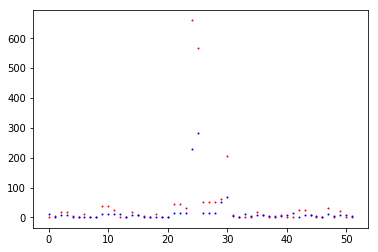

In [15]:
i = 0
for st in cat_feature_list:
    plt.scatter(x=i, y=len(st), c='red', s =1)
    i = i +1

i = 0
for st in num_feature_list:
    plt.scatter(x=i, y=len(st), c='blue', s=1)
    i = i +1

    

In [21]:
cat.head()

Id L0_S1_F25 L0_S1_F27 L0_S1_F29 L0_S1_F31 L0_S2_F33 L0_S2_F35 L0_S2_F37  \
0   4       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1   6       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2   7       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3   9       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
4  11       NaN       NaN       NaN       NaN       NaN       NaN       NaN   

  L0_S2_F39 L0_S2_F41 L0_S2_F43 L0_S2_F45 L0_S2_F47 L0_S2_F49 L0_S2_F51  \
0       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
4       NaN       NaN       NaN       NaN       NaN       NaN       NaN   

  L0_S2_F53 L0_S2_F55 L0_S2_F57 L0_S2_F59 L0_S2_F61 L0_S2_F63 L0_S2_F65  \
0       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
4       NaN       NaN       NaN       NaN       NaN       NaN       NaN   

  L0_S2_F67  L0_S3_F69  L0_S3_F71  L0_S3_F73  L0_S3_F75  L0_S3_F77  L0_S3_F79  \
0       NaN        NaN        NaN        NaN        NaN        NaN        NaN   
1       NaN        NaN        NaN        NaN        NaN        NaN        NaN   
2       NaN        NaN        NaN        NaN        NaN        NaN        NaN   
3       NaN        NaN        NaN        NaN        NaN        NaN        NaN   
4       NaN        NaN        NaN        NaN        NaN        NaN        NaN   

   L0_S3_F81  L0_S3_F83  L0_S3_F85  L0_S3_F87  L0_S3_F89  L0_S3_F91  \
0        NaN        NaN        NaN        NaN        NaN        NaN   
1        NaN        NaN        NaN        NaN        NaN        NaN   
2        NaN        NaN        NaN        NaN        NaN        NaN   
3        NaN        NaN        NaN        NaN        NaN        NaN   
4        NaN        NaN        NaN        NaN        NaN        NaN   

   L0_S3_F93  L0_S3_F95  L0_S3_F97  L0_S3_F99  L0_S3_F101  L0_S3_F103  \
0        NaN        NaN        NaN        NaN         NaN         NaN   
1        NaN        NaN        NaN        NaN         NaN         NaN   
2        NaN        NaN        NaN        NaN         NaN         NaN   
3        NaN        NaN        NaN        NaN         NaN         NaN   
4        NaN        NaN        NaN        NaN         NaN         NaN   

  L0_S4_F105 L0_S4_F107 L0_S4_F108  L0_S4_F110  L0_S4_F112  L0_S4_F113  \
0        NaN        NaN        NaN         NaN         NaN         NaN   
1        NaN        NaN        NaN         NaN         NaN         NaN   
2        NaN        NaN        NaN         NaN         NaN         NaN   
3        NaN        NaN        NaN         NaN         NaN         NaN   
4        NaN        NaN        NaN         NaN         NaN         NaN   

   L0_S6_F119  L0_S6_F121  L0_S6_F123  L0_S6_F125  L0_S6_F126  L0_S6_F128  \
0         NaN         NaN         NaN         NaN         NaN         NaN   
1         NaN         NaN         NaN         NaN         NaN         NaN   
2         NaN         NaN         NaN         NaN         NaN         NaN   
3         NaN         NaN         NaN         NaN         NaN         NaN   
4         NaN         NaN         NaN         NaN         NaN         NaN   

   L0_S6_F129  L0_S6_F131  L0_S6_F133  L0_S6_F135 L0_S9_F151  L0_S9_F153  \
0         NaN         NaN         NaN         NaN        NaN         NaN   
1         NaN         NaN         NaN         NaN        NaN         NaN   
2         NaN         NaN         NaN         NaN        NaN         NaN   
3         NaN         NaN         NaN         NaN        NaN 

In [23]:
tmp_list = cat_feature_list[32]
tmp_list.append('Response')

cat_S32 = df.loc[:, tmp_list]
cat_S32_ng = cat_S32.loc[df['Response'] == 1]
cat_S32_ng
# L3_S32_F3854	L3_S35_F3899


,L3_S32_F3851,L3_S32_F3853,L3_S32_F3854,Response,Response,Response,Response,Response
539,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0
633,T1,NaN,T2,1.0,1.0,1.0,1.0,1.0
681,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0
887,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0
1152,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0
1731,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0
1759,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0
2028,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0
2469,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0
2479,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0


In [105]:
cat_S32_ok = cat_S32.loc[df['Response'] == 0]
cat_S32_ok.L3_S32_F3854.count()



0

In [108]:

cat_S29 = cat.loc[:, cat_feature_list[29]]
#cat_S32_ng = cat_S32.loc[df['Response'] == 1]
cat_S29

,L3_S29_F3317,L3_S29_F3320,L3_S29_F3323,L3_S29_F3326,L3_S29_F3329,L3_S29_F3332,L3_S29_F3335,L3_S29_F3338,L3_S29_F3341,L3_S29_F3344,L3_S29_F3347,L3_S29_F3350,L3_S29_F3353,L3_S29_F3356,L3_S29_F3359,L3_S29_F3362,L3_S29_F3364,L3_S29_F3366,L3_S29_F3369,L3_S29_F3372,L3_S29_F3375,L3_S29_F3378,L3_S29_F3381,L3_S29_F3384,L3_S29_F3387,L3_S29_F3390,L3_S29_F3392,L3_S29_F3394,L3_S29_F3397,L3_S29_F3400,L3_S29_F3403,L3_S29_F3406,L3_S29_F3409,L3_S29_F3411,L3_S29_F3414,L3_S29_F3416,L3_S29_F3418,L3_S29_F3420,L3_S29_F3423,L3_S29_F3426,L3_S29_F3429,L3_S29_F3432,L3_S29_F3435,L3_S29_F3438,L3_S29_F3441,L3_S29_F3444,L3_S29_F3446,L3_S29_F3448,L3_S29_F3451,L3_S29_F3454,L3_S29_F3457,L3_S29_F3460,L3_S29_F3463,L3_S29_F3466,L3_S29_F3469,L3_S29_F3472,L3_S29_F3475,L3_S29_F3478,L3_S29_F3481,L3_S29_F3484,L3_S29_F3487,L3_S29_F3490,L3_S29_F3493
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1
3,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1
4,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1
5,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1
6,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1
7,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1
8,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1
9,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1,T1


In [113]:
cat.loc[:60, :]

Id L0_S1_F25 L0_S1_F27 L0_S1_F29 L0_S1_F31 L0_S2_F33 L0_S2_F35 L0_S2_F37  \
0     4       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1     6       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2     7       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3     9       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
4    11       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
5    13       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
6    14       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
7    16       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
8    18       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
9    23       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
10   26       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
11   27       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
12   28       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
13   31       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
14   34       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
15   38       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
16   41       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
17   44       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
18   47       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
19   49       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
20   52       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
21   55       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
22   56       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
23   57       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
24   63       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
25   68       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
26   70       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
27   71       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
28   72       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
29   73       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
..  ...       ...       ...       ...       ...       ...       ...       ...   
31   76       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
32   78       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
33   79       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
34   81       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
35   82       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
36   84       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
37   86       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
38   87       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
39   88       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
40   91       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
41   92       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
42   93       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
43   95       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
44   96       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
45   97       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
46   98       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
47   99       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
48  102       NaN       NaN       Na

In [161]:
cat_S32 = cat.loc[:, cat_feature_list[32]]
cat_Trim = cat_S32.L3_S32_F3854.str[1:]
cat_Trim.astype(float).fillna(0).astype(int)[:60]
print (type(cat_S32.L3_S32_F3854))

print (type(cat_S32.iloc[:,[0]]))
#cat_S32.iloc[:,[1]].head()
cat_S32_Series = cat_S32.iloc[:,[1]].unstack()
cat_S32_Series['L3_S32_F3853'].str[1:]

<class 'pandas.core.series.Series'>
<class 'pandas.core.frame.DataFrame'>


C:\Users\Takumi\Anaconda3\envs\Kaggle\lib\site-packages\pandas\core\indexing.py:1472: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_tuple(key)


AttributeError: Can only use .str accessor with string values, which use np.object_ dtype in pandas

In [ ]:
tmp1 = pd.read_csv("train_categorical.csv", index_col=0, dtype='object', usecols = np.hstack(('Id', 'L3_S32_F3854')))
tmp1.iloc[:,i] = tmp1.iloc[:,i].str[1:]       
tmp1 = tmp1.astype(float).fillna(0).astype(int)

In [24]:
df.head()

Id  Response L0_S1_F25 L0_S1_F27 L0_S1_F29 L0_S1_F31 L0_S2_F33 L0_S2_F35  \
0   4.0       0.0       NaN       NaN       NaN       NaN       NaN       NaN   
1   6.0       0.0       NaN       NaN       NaN       NaN       NaN       NaN   
2   7.0       0.0       NaN       NaN       NaN       NaN       NaN       NaN   
3   9.0       0.0       NaN       NaN       NaN       NaN       NaN       NaN   
4  11.0       0.0       NaN       NaN       NaN       NaN       NaN       NaN   

  L0_S2_F37 L0_S2_F39 L0_S2_F41 L0_S2_F43 L0_S2_F45 L0_S2_F47 L0_S2_F49  \
0       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
4       NaN       NaN       NaN       NaN       NaN       NaN       NaN   

  L0_S2_F51 L0_S2_F53 L0_S2_F55 L0_S2_F57 L0_S2_F59 L0_S2_F61 L0_S2_F63  \
0       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
4       NaN       NaN       NaN       NaN       NaN       NaN       NaN   

  L0_S2_F65 L0_S2_F67  L0_S3_F69  L0_S3_F71  L0_S3_F73  L0_S3_F75  L0_S3_F77  \
0       NaN       NaN        NaN        NaN        NaN        NaN        NaN   
1       NaN       NaN        NaN        NaN        NaN        NaN        NaN   
2       NaN       NaN        NaN        NaN        NaN        NaN        NaN   
3       NaN       NaN        NaN        NaN        NaN        NaN        NaN   
4       NaN       NaN        NaN        NaN        NaN        NaN        NaN   

   L0_S3_F79  L0_S3_F81  L0_S3_F83  L0_S3_F85  L0_S3_F87  L0_S3_F89  \
0        NaN        NaN        NaN        NaN        NaN        NaN   
1        NaN        NaN        NaN        NaN        NaN        NaN   
2        NaN        NaN        NaN        NaN        NaN        NaN   
3        NaN        NaN        NaN        NaN        NaN        NaN   
4        NaN        NaN        NaN        NaN        NaN        NaN   

   L0_S3_F91  L0_S3_F93  L0_S3_F95  L0_S3_F97  L0_S3_F99  L0_S3_F101  \
0        NaN        NaN        NaN        NaN        NaN         NaN   
1        NaN        NaN        NaN        NaN        NaN         NaN   
2        NaN        NaN        NaN        NaN        NaN         NaN   
3        NaN        NaN        NaN        NaN        NaN         NaN   
4        NaN        NaN        NaN        NaN        NaN         NaN   

   L0_S3_F103 L0_S4_F105 L0_S4_F107 L0_S4_F108 L0_S4_F110 L0_S4_F112  \
0         NaN        NaN        NaN        NaN        NaN        NaN   
1         NaN        NaN        NaN        NaN        NaN        NaN   
2         NaN        NaN        NaN        NaN        NaN        NaN   
3         NaN        NaN        NaN        NaN        NaN        NaN   
4         NaN        NaN        NaN        NaN        NaN        NaN   

  L0_S4_F113  L0_S6_F119  L0_S6_F121  L0_S6_F123  L0_S6_F125  L0_S6_F126  \
0        NaN         NaN         NaN         NaN         NaN         NaN   
1        NaN         NaN         NaN         NaN         NaN         NaN   
2        NaN         NaN         NaN         NaN         NaN         NaN   
3        NaN         NaN         NaN         NaN         NaN         NaN   
4        NaN         NaN         NaN         NaN         NaN         NaN   

   L0_S6_F128  L0_S6_F129  L0_S6_F131  L0_S6_F133  L0_S6_F135 L0_S9_F151  \
0         NaN         NaN         NaN         NaN         NaN        NaN   
1         NaN         NaN         NaN         NaN         NaN        NaN   
2         NaN         NaN         NaN         NaN         NaN        NaN   
3         NaN         NaN         NaN         NaN         NaN        NaN   
4    

In [25]:
cat_feature_list

[[],
 ['L0_S1_F25', 'L0_S1_F27', 'L0_S1_F29', 'L0_S1_F31'],
 ['L0_S2_F33',
  'L0_S2_F35',
  'L0_S2_F37',
  'L0_S2_F39',
  'L0_S2_F41',
  'L0_S2_F43',
  'L0_S2_F45',
  'L0_S2_F47',
  'L0_S2_F49',
  'L0_S2_F51',
  'L0_S2_F53',
  'L0_S2_F55',
  'L0_S2_F57',
  'L0_S2_F59',
  'L0_S2_F61',
  'L0_S2_F63',
  'L0_S2_F65',
  'L0_S2_F67'],
 ['L0_S3_F69',
  'L0_S3_F71',
  'L0_S3_F73',
  'L0_S3_F75',
  'L0_S3_F77',
  'L0_S3_F79',
  'L0_S3_F81',
  'L0_S3_F83',
  'L0_S3_F85',
  'L0_S3_F87',
  'L0_S3_F89',
  'L0_S3_F91',
  'L0_S3_F93',
  'L0_S3_F95',
  'L0_S3_F97',
  'L0_S3_F99',
  'L0_S3_F101',
  'L0_S3_F103'],
 ['L0_S4_F105',
  'L0_S4_F107',
  'L0_S4_F108',
  'L0_S4_F110',
  'L0_S4_F112',
  'L0_S4_F113'],
 [],
 ['L0_S6_F119',
  'L0_S6_F121',
  'L0_S6_F123',
  'L0_S6_F125',
  'L0_S6_F126',
  'L0_S6_F128',
  'L0_S6_F129',
  'L0_S6_F131',
  'L0_S6_F133',
  'L0_S6_F135'],
 [],
 [],
 ['L0_S9_F151',
  'L0_S9_F153',
  'L0_S9_F154',
  'L0_S9_F156',
  'L0_S9_F158',
  'L0_S9_F159',
  'L0_S9_F161',
  'L0_S9_F1

In [26]:
num_feature_list

[['L0_S0_F0',
  'L0_S0_F2',
  'L0_S0_F4',
  'L0_S0_F6',
  'L0_S0_F8',
  'L0_S0_F10',
  'L0_S0_F12',
  'L0_S0_F14',
  'L0_S0_F16',
  'L0_S0_F18',
  'L0_S0_F20',
  'L0_S0_F22'],
 ['L0_S1_F24', 'L0_S1_F28'],
 ['L0_S2_F32',
  'L0_S2_F36',
  'L0_S2_F40',
  'L0_S2_F44',
  'L0_S2_F48',
  'L0_S2_F52',
  'L0_S2_F56',
  'L0_S2_F60',
  'L0_S2_F64'],
 ['L0_S3_F68',
  'L0_S3_F72',
  'L0_S3_F76',
  'L0_S3_F80',
  'L0_S3_F84',
  'L0_S3_F88',
  'L0_S3_F92',
  'L0_S3_F96',
  'L0_S3_F100'],
 ['L0_S4_F104', 'L0_S4_F109'],
 ['L0_S5_F114', 'L0_S5_F116'],
 ['L0_S6_F118', 'L0_S6_F122', 'L0_S6_F132'],
 ['L0_S7_F136', 'L0_S7_F138', 'L0_S7_F142'],
 ['L0_S8_F144', 'L0_S8_F146', 'L0_S8_F149'],
 ['L0_S9_F155',
  'L0_S9_F160',
  'L0_S9_F165',
  'L0_S9_F170',
  'L0_S9_F175',
  'L0_S9_F180',
  'L0_S9_F185',
  'L0_S9_F190',
  'L0_S9_F195',
  'L0_S9_F200',
  'L0_S9_F205',
  'L0_S9_F210'],
 ['L0_S10_F219',
  'L0_S10_F224',
  'L0_S10_F229',
  'L0_S10_F234',
  'L0_S10_F239',
  'L0_S10_F244',
  'L0_S10_F249',
  'L0_S10_F25

In [27]:
date.head()

,Id,L0_S0_D1,L0_S0_D3,L0_S0_D5,L0_S0_D7,L0_S0_D9,L0_S0_D11,L0_S0_D13,L0_S0_D15,L0_S0_D17,L0_S0_D19,L0_S0_D21,L0_S0_D23,L0_S1_D26,L0_S1_D30,L0_S2_D34,L0_S2_D38,L0_S2_D42,L0_S2_D46,L0_S2_D50,L0_S2_D54,L0_S2_D58,L0_S2_D62,L0_S2_D66,L0_S3_D70,L0_S3_D74,L0_S3_D78,L0_S3_D82,L0_S3_D86,L0_S3_D90,L0_S3_D94,L0_S3_D98,L0_S3_D102,L0_S4_D106,L0_S4_D111,L0_S5_D115,L0_S5_D117,L0_S6_D120,L0_S6_D124,L0_S6_D127,L0_S6_D130,L0_S6_D134,L0_S7_D137,L0_S7_D139,L0_S7_D140,L0_S7_D141,L0_S7_D143,L0_S8_D145,L0_S8_D147,L0_S8_D148,L0_S8_D150,L0_S9_D152,L0_S9_D157,L0_S9_D162,L0_S9_D167,L0_S9_D172,L0_S9_D177,L0_S9_D182,L0_S9_D187,L0_S9_D192,L0_S9_D197,L0_S9_D202,L0_S9_D207,L0_S9_D212,L0_S10_D216,L0_S10_D221,L0_S10_D226,L0_S10_D231,L0_S10_D236,L0_S10_D241,L0_S10_D246,L0_S10_D251,L0_S10_D256,L0_S10_D261,L0_S10_D266,L0_S10_D271,L0_S10_D276,L0_S11_D280,L0_S11_D284,L0_S11_D288,L0_S11_D292,L0_S11_D296,L0_S11_D300,L0_S11_D304,L0_S11_D308,L0_S11_D312,L0_S11_D316,L0_S11_D320,L0_S11_D324,L0_S11_D328,L0_S12_D331,L0_S12_D333,L0_S12_D335,L0_S12_D337,L0_S12_D339,L0_S12_D341,L0_S12_D343,L0_S12_D345,L0_S12_D347,L0_S12_D349,L0_S12_D351,L0_S12_D353,L0_S13_D355,L0_S13_D357,L0_S14_D360,L0_S14_D364,L0_S14_D368,L0_S14_D372,L0_S14_D376,L0_S14_D380,L0_S14_D384,L0_S14_D388,L0_S14_D392,L0_S15_D395,L0_S15_D398,L0_S15_D401,L0_S15_D404,L0_S15_D407,L0_S15_D410,L0_S15_D413,L0_S15_D416,L0_S15_D419,L0_S16_D423,L0_S16_D428,L0_S17_D432,L0_S17_D434,L0_S18_D437,L0_S18_D441,L0_S18_D444,L0_S18_D447,L0_S18_D451,L0_S19_D454,L0_S19_D456,L0_S19_D457,L0_S19_D458,L0_S19_D460,L0_S20_D462,L0_S20_D464,L0_S20_D465,L0_S20_D467,L0_S21_D469,L0_S21_D474,L0_S21_D479,L0_S21_D484,L0_S21_D489,L0_S21_D494,L0_S21_D499,L0_S21_D504,L0_S21_D509,L0_S21_D514,L0_S21_D519,L0_S21_D524,L0_S21_D529,L0_S21_D534,L0_S21_D539,L0_S22_D543,L0_S22_D548,L0_S22_D553,L0_S22_D558,L0_S22_D563,L0_S22_D568,L0_S22_D573,L0_S22_D578,L0_S22_D583,L0_S22_D588,L0_S22_D593,L0_S22_D598,L0_S22_D603,L0_S22_D608,L0_S22_D613,L0_S23_D617,L0_S23_D621,L0_S23_D625,L0_S23_D629,L0_S23_D633,L0_S23_D637,L0_S23_D641,L0_S23_D645,L0_S23_D649,L0_S23_D653,L0_S23_D657,L0_S23_D661,L0_S23_D665,L0_S23_D669,L0_S23_D673,L1_S24_D677,L1_S24_D681,L1_S24_D685,L1_S24_D689,L1_S24_D693,L1_S24_D697,L1_S24_D702,L1_S24_D707,L1_S24_D712,L1_S24_D716,L1_S24_D721,L1_S24_D725,L1_S24_D730,L1_S24_D735,L1_S24_D739,L1_S24_D743,L1_S24_D748,L1_S24_D753,L1_S24_D758,L1_S24_D763,L1_S24_D768,L1_S24_D772,L1_S24_D777,L1_S24_D782,L1_S24_D787,L1_S24_D792,L1_S24_D797,L1_S24_D801,L1_S24_D804,L1_S24_D807,L1_S24_D809,L1_S24_D811,L1_S24_D813,L1_S24_D815,L1_S24_D818,L1_S24_D822,L1_S24_D826,L1_S24_D831,L1_S24_D836,L1_S24_D841,L1_S24_D846,L1_S24_D850,L1_S24_D854,L1_S24_D859,L1_S24_D864,L1_S24_D869,L1_S24_D874,L1_S24_D879,L1_S24_D884,L1_S24_D889,L1_S24_D894,L1_S24_D899,L1_S24_D904,L1_S24_D909,L1_S24_D913,L1_S24_D917,L1_S24_D922,L1_S24_D927,L1_S24_D932,L1_S24_D937,L1_S24_D941,L1_S24_D945,L1_S24_D950,L1_S24_D955,L1_S24_D960,L1_S24_D965,L1_S24_D970,L1_S24_D975,L1_S24_D980,L1_S24_D985,L1_S24_D990,L1_S24_D995,L1_S24_D999,L1_S24_D1001,L1_S24_D1003,L1_S24_D1005,L1_S24_D1007,L1_S24_D1009,L1_S24_D1011,L1_S24_D1013,L1_S24_D1015,L1_S24_D1018,L1_S24_D1023,L1_S24_D1028,L1_S24_D1033,L1_S24_D1038,L1_S24_D1043,L1_S24_D1048,L1_S24_D1053,L1_S24_D1058,L1_S24_D1062,L1_S24_D1066,L1_S24_D1070,L1_S24_D1074,L1_S24_D1077,L1_S24_D1081,L1_S24_D1085,L1_S24_D1089,L1_S24_D1092,L1_S24_D1096,L1_S24_D1100,L1_S24_D1104,L1_S24_D1108,L1_S24_D1112,L1_S24_D1116,L1_S24_D1120,L1_S24_D1124,L1_S24_D1128,L1_S24_D1132,L1_S24_D1135,L1_S24_D1138,L1_S24_D1141,L1_S24_D1143,L1_S24_D1146,L1_S24_D1149,L1_S24_D1151,L1_S24_D1153,L1_S24_D1155,L1_S24_D1158,L1_S24_D1163,L1_S24_D1168,L1_S24_D1171,L1_S24_D1173,L1_S24_D1175,L1_S24_D1178,L1_S24_D1182,L1_S24_D1186,L1_S24_D1190,L1_S24_D1194,L1_S24_D1199,L1_S24_D1204,L1_S24_D1209,L1_S24_D1214,L1_S24_D1218,L1_S24_D1222,L1_S24_D1227,L1_S24_D1232,L1_S24_D1237,L1_S24_D1242,L1_S24_D1247,L1_S24_D1252,L1_S24_D1257,L1_S24_D1262,L1_S24_D1267,L1_S24_D1272,L1_S24_D1277,L1_S24_D1281,L1_S24_D1285,L1_S24_D1290,L1_S24_D1295,L1_S24_D13

In [28]:
cat_S32.head()

,L3_S32_F3851,L3_S32_F3853,L3_S32_F3854,Response,Response,Response,Response,Response
0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0
1,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0
2,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0
3,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0
4,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0


# DateのStation通過情報と合わせてみてみる。

In [31]:
CHUNK_SIZE = 100000

start = datetime.now()

reader_date = pd.read_csv("train_date.csv",chunksize=CHUNK_SIZE, dtype=np.float32)
reader_res = pd.read_csv("output/df_id_response.csv",chunksize=CHUNK_SIZE, dtype=np.float32)


#分割して読み込み
loop = 0
cnt_0 = 0
cnt_1 = 0
for df_chunk_date in reader_date:
    df_chunk_num = reader_res.get_chunk(CHUNK_SIZE)
    
    df_chunk = pd.merge(on="Id", left=df_chunk_date, right=df_chunk_num)
    cnt_0 = cnt_0 + len(df_chunk[df_chunk['Response'] == 0].index)
    cnt_1 = cnt_1 + len(df_chunk[df_chunk['Response'] == 1].index)

    if loop == 0:
        df_date = df_chunk
    else:
        df_date = pd.concat([df_date, df_chunk])
    
    print("loop : {} / Rows = {}".format(loop, len(df_date.index)))

    loop = loop + 1

print("0:{}, 1:{}".format(cnt_0, cnt_1))
print("{} -> {}".format(start, datetime.now()))
print("Memory:{}".format(df.memory_usage(index=True).sum()))

loop : 0 / Rows = 100000
loop : 1 / Rows = 200000
loop : 2 / Rows = 300000
loop : 3 / Rows = 400000
loop : 4 / Rows = 500000
loop : 5 / Rows = 600000
loop : 6 / Rows = 700000
loop : 7 / Rows = 800000
loop : 8 / Rows = 900000
loop : 9 / Rows = 1000000
loop : 10 / Rows = 1100000
loop : 11 / Rows = 1183747
0:1176868, 1:6879
2018-07-15 23:26:37.893915 -> 2018-07-15 23:28:32.888016
Memory:1713600000


In [32]:
STATION_NUM = 52

date_cols = df_date.columns

date_feature_list = []

for cur_station_id in range(STATION_NUM):
    date_feature_list_one = []
    for column_name in date_cols:
        if column_name != 'Id':
            r = parse("L{}_S{}_D{}", column_name)
            if r is not None:
                col_line_id    = int(r[0])
                col_station_id = int(r[1])
                
                if cur_station_id == col_station_id:
                    date_feature_list_one.append(column_name)

    date_feature_list.append(date_feature_list_one)

stations_top = []
for st in date_feature_list:
    stations_top.append(st[0])

stations_top    

['L0_S0_D1',
 'L0_S1_D26',
 'L0_S2_D34',
 'L0_S3_D70',
 'L0_S4_D106',
 'L0_S5_D115',
 'L0_S6_D120',
 'L0_S7_D137',
 'L0_S8_D145',
 'L0_S9_D152',
 'L0_S10_D216',
 'L0_S11_D280',
 'L0_S12_D331',
 'L0_S13_D355',
 'L0_S14_D360',
 'L0_S15_D395',
 'L0_S16_D423',
 'L0_S17_D432',
 'L0_S18_D437',
 'L0_S19_D454',
 'L0_S20_D462',
 'L0_S21_D469',
 'L0_S22_D543',
 'L0_S23_D617',
 'L1_S24_D677',
 'L1_S25_D1854',
 'L2_S26_D3037',
 'L2_S27_D3130',
 'L2_S28_D3223',
 'L3_S29_D3316',
 'L3_S30_D3496',
 'L3_S31_D3836',
 'L3_S32_D3852',
 'L3_S33_D3856',
 'L3_S34_D3875',
 'L3_S35_D3886',
 'L3_S36_D3919',
 'L3_S37_D3942',
 'L3_S38_D3953',
 'L3_S39_D3966',
 'L3_S40_D3981',
 'L3_S41_D3997',
 'L3_S42_D4029',
 'L3_S43_D4062',
 'L3_S44_D4101',
 'L3_S45_D4125',
 'L3_S46_D4135',
 'L3_S47_D4140',
 'L3_S48_D4194',
 'L3_S49_D4208',
 'L3_S50_D4242',
 'L3_S51_D4255']

In [91]:
df_station_top = df_date.loc[:, stations_top]
df_station_top['Id'] = df_date.Id
df_station_top['Response'] = df_date.Response

In [92]:
df_station_top.to_csv('output/station_top_date.csv')

In [93]:
df_station_top.set_index('Id')

,L0_S0_D1,L0_S1_D26,L0_S2_D34,L0_S3_D70,L0_S4_D106,L0_S5_D115,L0_S6_D120,L0_S7_D137,L0_S8_D145,L0_S9_D152,L0_S10_D216,L0_S11_D280,L0_S12_D331,L0_S13_D355,L0_S14_D360,L0_S15_D395,L0_S16_D423,L0_S17_D432,L0_S18_D437,L0_S19_D454,L0_S20_D462,L0_S21_D469,L0_S22_D543,L0_S23_D617,L1_S24_D677,L1_S25_D1854,L2_S26_D3037,L2_S27_D3130,L2_S28_D3223,L3_S29_D3316,L3_S30_D3496,L3_S31_D3836,L3_S32_D3852,L3_S33_D3856,L3_S34_D3875,L3_S35_D3886,L3_S36_D3919,L3_S37_D3942,L3_S38_D3953,L3_S39_D3966,L3_S40_D3981,L3_S41_D3997,L3_S42_D4029,L3_S43_D4062,L3_S44_D4101,L3_S45_D4125,L3_S46_D4135,L3_S47_D4140,L3_S48_D4194,L3_S49_D4208,L3_S50_D4242,L3_S51_D4255,Response
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4.0,82.239998,82.239998,82.239998,NaN,82.260002,NaN,NaN,82.260002,82.269997,NaN,NaN,82.269997,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,87.260002,87.260002,87.269997,NaN,87.279999,87.279999,87.290001,NaN,87.290001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1313.119995,1313.119995,1313.119995,NaN,1313.140015,NaN,1313.150024,NaN,1313.150024,1313.150024,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1315.729980,1315.729980,NaN,NaN,1315.750000,1315.750000,1315.750000,NaN,1315.750000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
7.0,1618.699951,1618.699951,1618.699951,NaN,NaN,1618.719971,1618.719971,NaN,1618.729980,NaN,1618.729980,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1624.400024,1624.410034,NaN,NaN,1624.420044,1624.420044,1624.420044,NaN,1624.420044,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
9.0,1149.199951,1149.199951,1149.209961,NaN,1149.219971,NaN,NaN,1149.219971,1149.219971,NaN,1149.219971,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1154.119995,1154.130005,NaN,NaN,1154.140015,1154.150024,NaN,1154.160034,1154.160034,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
11.0,602.640015,602.640015,NaN,602.640015,602.659973,NaN,NaN,602.669983,602.669983,NaN,NaN,602.669983,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,606.000000,606.000000,NaN,NaN,606.010010,606.010010,NaN,606.020020,606.020020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
13.0,1331.660034,1331.660034,NaN,1331.670044,1331.680054,NaN,NaN,1331.680054,1331.689941,NaN,1331.689941,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1339.689941,1339.699951,NaN,NaN,1339.709961,1339.719971,NaN,1339.729980,1339.729980,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
14.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1662.630005,1662.630005,NaN,1662.630005,NaN,1662.650024,NaN,1662.650024,1662.650024,NaN,1662.660034,NaN,NaN,NaN,NaN,NaN,NaN,1664.020020,1664.030029,NaN,NaN,1664.040039,1664.040039,1664.040039,NaN,1664.040039,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
16.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,802.219971,NaN,NaN,804.340027,804.340027,NaN,NaN,804.349976,804.349976,804.359985,NaN,804.359985,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
18.0,517.640015,517.640015,517.640015,NaN,517.650024,NaN,NaN,517.659973,517.659973,NaN,517.659973,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,518.059998,518.059998,NaN,NaN,518.070007,518.070007,NaN,518.080017,518.080017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0


# x:ID, y:time

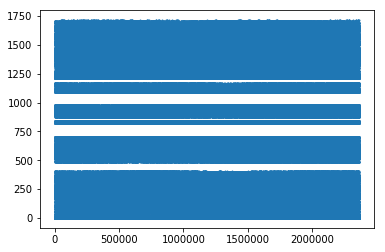

In [94]:
df_station_top_fillzeros = df_station_top.fillna(0)
plt.scatter (df_station_top_fillzeros.Id,  df_station_top_fillzeros.L0_S0_D1.values, s=1)

In [158]:
df_station_top_transpose_ok = df_station_top.drop('Id', axis=1)[df_station_top['Response'] == 0].transpose()
df_station_top_transpose_ng = df_station_top.drop('Id', axis=1)[df_station_top['Response'] == 1].transpose()
#plt.scatter (df_station_top_fillzeros.Id,  df_station_top_fillzeros.L0_S0_D1.values, s=1)
df_station_top_transpose_ng.tail()

539    633    681    887    1152   1731   1759   2028   2469   \
L3_S48_D4194    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S49_D4208    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S50_D4242    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S51_D4255    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
Response        1.0    1.0    1.0    1.0    1.0    1.0    1.0    1.0    1.0   

              2479   2489   2490   2570   2571   2572   2952   2974   \
L3_S48_D4194    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S49_D4208    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S50_D4242    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S51_D4255    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
Response        1.0    1.0    1.0    1.0    1.0    1.0    1.0    1.0   

                    3134   3515   3726   3783   3793   3969   4027   4208   \
L3_S48_D4194  1398.630005    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S49_D4208  1398.650024    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S50_D4242          NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S51_D4255  1398.650024    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
Response         1.000000    1.0    1.0    1.0    1.0    1.0    1.0    1.0   

              4607   4680   4707   4721   4725   4728   4798   5125   5454   \
L3_S48_D4194    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S49_D4208    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S50_D4242    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S51_D4255    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
Response        1.0    1.0    1.0    1.0    1.0    1.0    1.0    1.0    1.0   

              5720   5815   5879   5961   6004   6178   6229   6255   \
L3_S48_D4194    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S49_D4208    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S50_D4242    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S51_D4255    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
Response        1.0    1.0    1.0    1.0    1.0    1.0    1.0    1.0   

                   6316   6442   6661   6965   6974   8105   8265   8411   \
L3_S48_D4194  551.099976    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S49_D4208  551.099976    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S50_D4242         NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S51_D4255  551.109985    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
Response        1.000000    1.0    1.0    1.0    1.0    1.0    1.0    1.0   

              8950   9112   9421   10517  10526  10613        10633  10641  \
L3_S48_D4194    NaN    NaN    NaN    NaN    NaN    NaN  1457.449951    NaN   
L3_S49_D4208    NaN    NaN    NaN    NaN    NaN    NaN  1457.449951    NaN   
L3_S50_D4242    NaN    NaN    NaN    NaN    NaN    NaN          NaN    NaN   
L3_S51_D4255    NaN    NaN    NaN    NaN    NaN    NaN  1457.459961    NaN   
Response        1.0    1.0    1.0    1.0    1.0    1.0     1.000000    1.0   

              10658  10722  10723  10817  10940  11171  11432  11823  11949  \
L3_S48_D4194    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S49_D4208    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S50_D4242    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S51_D4255    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
Response        1.0    1.0    1.0    1.0    1.0    1.0    1.0    1.0    1.0   

              11988  11995  12231  12232  12711  12721  13228  13537  13573  \
L3_S48_D4194    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S49_D4208    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S50_D4242    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
L3_S51

In [116]:
df_station_top_transpose_ng.iloc[:, 0].head()

L0_S0_D1      0.0
L0_S1_D26     0.0
L0_S2_D34     0.0
L0_S3_D70     0.0
L0_S4_D106    0.0
Name: 539, dtype: float32

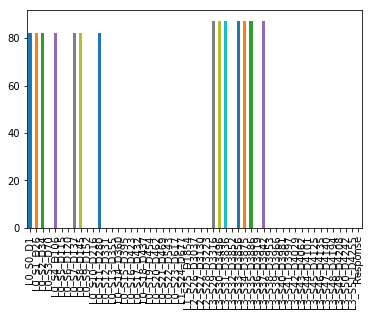

In [159]:
df_station_top_transpose_ok.fillna(0).iloc[:, 0].plot.bar()

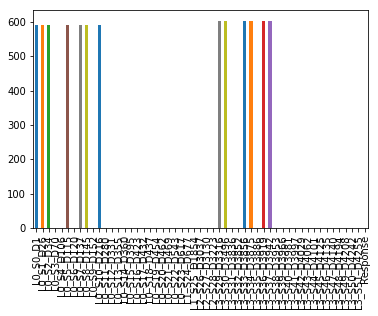

In [162]:
df_station_top_transpose_ok.fillna(0).iloc[:, 45000].plot.bar()

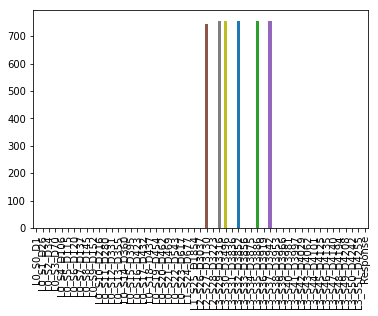

In [163]:
df_station_top_transpose_ng.fillna(0).iloc[:, 10].plot.bar()

In [130]:
df_station_top_transpose_ng.shape

(53, 6879)

In [164]:
df_station_top_transpose_ng.head()

539         633         681          887         1152   1731   \
L0_S0_D1      NaN  619.179993  640.200012  1153.459961  961.650024    NaN   
L0_S1_D26     NaN  619.190002  640.200012  1153.459961  961.650024    NaN   
L0_S2_D34     NaN         NaN  640.210022          NaN         NaN    NaN   
L0_S3_D70     NaN  619.190002         NaN  1153.469971  961.650024    NaN   
L0_S4_D106    NaN  619.200012  640.219971          NaN         NaN    NaN   

            1759   2028   2469         2479   2489   2490   2570   2571   \
L0_S0_D1      NaN    NaN    NaN  1600.390015    NaN    NaN    NaN    NaN   
L0_S1_D26     NaN    NaN    NaN  1600.390015    NaN    NaN    NaN    NaN   
L0_S2_D34     NaN    NaN    NaN          NaN    NaN    NaN    NaN    NaN   
L0_S3_D70     NaN    NaN    NaN  1601.280029    NaN    NaN    NaN    NaN   
L0_S4_D106    NaN    NaN    NaN  1601.349976    NaN    NaN    NaN    NaN   

            2572        2952   2974   3134   3515   3726         3783   \
L0_S0_D1      NaN  922.200012    NaN    NaN    NaN    NaN  1331.160034   
L0_S1_D26     NaN  922.200012    NaN    NaN    NaN    NaN  1331.160034   
L0_S2_D34     NaN         NaN    NaN    NaN    NaN    NaN  1331.160034   
L0_S3_D70     NaN  922.200012    NaN    NaN    NaN    NaN          NaN   
L0_S4_D106    NaN  922.229980    NaN    NaN    NaN    NaN  1331.180054   

                 3793         3969        4027        4208         4607   \
L0_S0_D1    634.520020  1643.290039  943.159973  257.399994  1511.540039   
L0_S1_D26   634.520020  1643.290039  943.159973  257.399994  1511.540039   
L0_S2_D34          NaN          NaN         NaN         NaN          NaN   
L0_S3_D70   634.580017  1643.290039  943.159973  257.399994  1511.540039   
L0_S4_D106         NaN  1643.310059         NaN         NaN  1511.560059   

            4680   4707        4721         4725   4728   4798         5125   \
L0_S0_D1      NaN    NaN  190.899994  1499.819946    NaN    NaN  1482.150024   
L0_S1_D26     NaN    NaN  190.899994  1499.819946    NaN    NaN  1482.150024   
L0_S2_D34     NaN    NaN  190.899994          NaN    NaN    NaN          NaN   
L0_S3_D70     NaN    NaN         NaN  1499.819946    NaN    NaN  1482.160034   
L0_S4_D106    NaN    NaN  190.910004          NaN    NaN    NaN          NaN   

                 5454        5720   5815   5879   5961   6004        6178   \
L0_S0_D1    956.440002  919.739990    NaN    NaN    NaN    NaN  241.429993   
L0_S1_D26   956.440002  919.739990    NaN    NaN    NaN    NaN  241.429993   
L0_S2_D34          NaN  919.760010    NaN    NaN    NaN    NaN  241.440002   
L0_S3_D70   956.440002         NaN    NaN    NaN    NaN    NaN         NaN   
L0_S4_D106  956.460022  919.780029    NaN    NaN    NaN    NaN  241.460007   

            6229   6255        6316        6442        6661        6965   \
L0_S0_D1      NaN    NaN  549.500000  922.770020  885.460022  970.710022   
L0_S1_D26     NaN    NaN  549.500000  922.770020  885.460022  970.710022   
L0_S2_D34     NaN    NaN         NaN  922.780029         NaN         NaN   
L0_S3_D70     NaN    NaN  549.500000         NaN  885.469971  970.710022   
L0_S4_D106    NaN    NaN  549.530029         NaN         NaN         NaN   

            6974         8105         8265        8411        8950   \
L0_S0_D1      NaN  1642.400024  1531.689941  909.140015  889.309998   
L0_S1_D26     NaN  1642.400024  1531.689941  909.140015  889.309998   
L0_S2_D34     NaN  1642.400024          NaN  909.140015         NaN   
L0_S3_D70     NaN          NaN  1531.689941         NaN  889.309998   
L0_S4_D106    NaN          NaN  1531.719971  909.169983         NaN   

                 9112         9421         10517        10526  10613  \
L0_S0_D1    943.280029  1482.189941  1265.449951  1272.599976    NaN   
L0_S1_D26   943.280029  1482.199951  1265.449951  1272.599976    NaN   
L0_S2_D34   943.280029          NaN  1265.459961          NaN    NaN   
L0_S3_D70          NaN  1482.199951          NaN  1272.599976    NaN

In [40]:
# dateの時間は複数分類あり。→ 作業終了時間とかか。
#　　→ 値をみて、NGかどうかみれないだろうか？

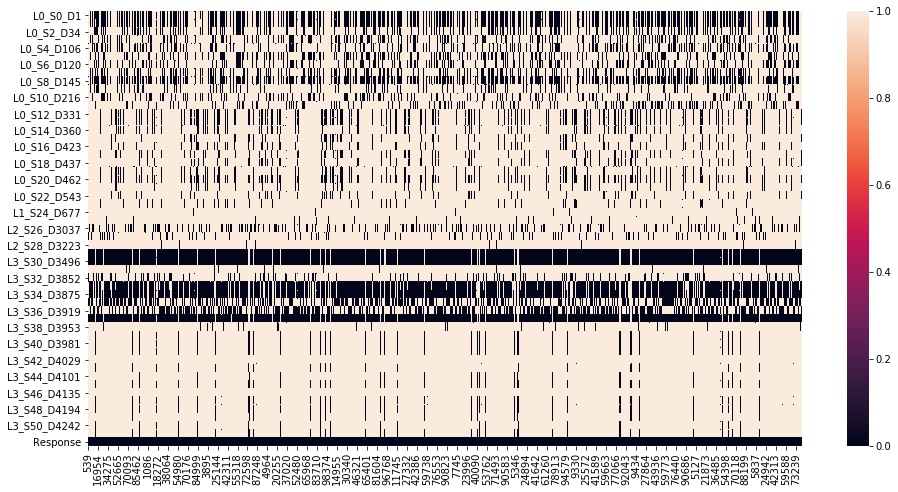

In [167]:
plt.figure(figsize=(16, 8)) 
sns.heatmap(df_station_top_transpose_ng.isna())

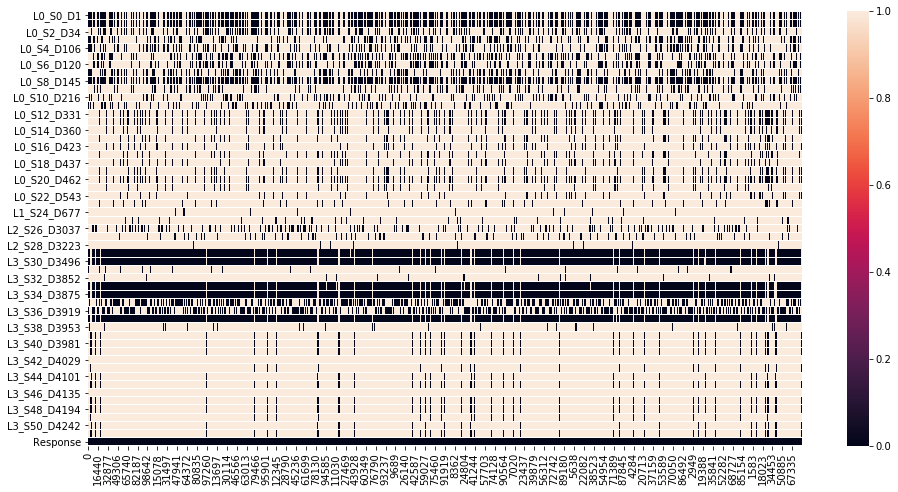

In [168]:
plt.figure(figsize=(16, 8)) 
sns.heatmap(df_station_top_transpose_ok.isna())

In [169]:
df_station_top_ok = df_station_top.drop('Id', axis=1)[df_station_top['Response'] == 0]
df_station_top_ng = df_station_top.drop('Id', axis=1)[df_station_top['Response'] == 1]


In [178]:
print(df_station_top_ng.drop_duplicates().shape)
print(df_station_top_ng.shape)
print(df_station_top_ok.drop_duplicates().shape)
print(df_station_top_ok.shape)



(6526, 53)
(6879, 53)
(1106548, 53)
(1176868, 53)


# NGの重複行

In [200]:
dup_ng = df_station_top_ng[df_station_top_ng.duplicated()]

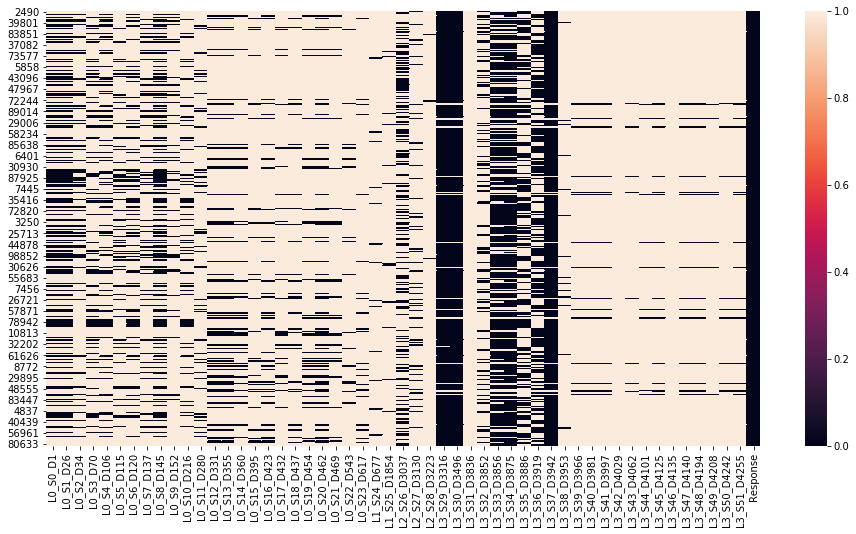

In [183]:
plt.figure(figsize=(16, 8)) 
sns.heatmap(dup_ng.isna())

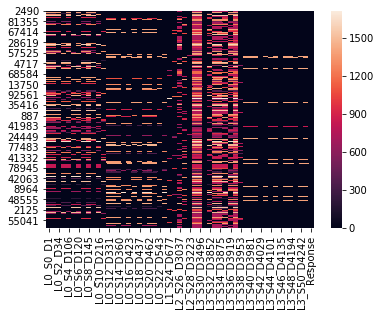

In [184]:
sns.heatmap(dup_ng.fillna(0))

In [190]:
start = datetime.now()
C = dup_ng.fillna(0).corr().abs()
print (C.Response.sort_values(ascending=False)[:20])

print("{} -> {}".format(start, datetime.now()))


L0_S0_D1      NaN
L0_S1_D26     NaN
L0_S2_D34     NaN
L0_S3_D70     NaN
L0_S4_D106    NaN
L0_S5_D115    NaN
L0_S6_D120    NaN
L0_S7_D137    NaN
L0_S8_D145    NaN
L0_S9_D152    NaN
L0_S10_D216   NaN
L0_S11_D280   NaN
L0_S12_D331   NaN
L0_S13_D355   NaN
L0_S14_D360   NaN
L0_S15_D395   NaN
L0_S16_D423   NaN
L0_S17_D432   NaN
L0_S18_D437   NaN
L0_S19_D454   NaN
Name: Response, dtype: float64
2018-07-16 01:06:50.304663 -> 2018-07-16 01:06:50.304663


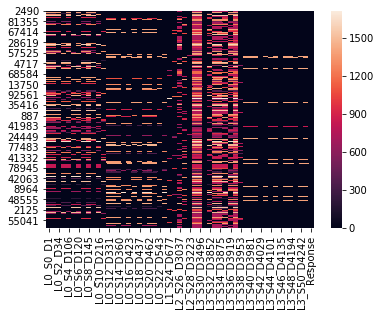

In [198]:
#dup_ng
sns.heatmap(dup_ng.fillna(0))

In [206]:
dup_ng_trans = dup_ng.transpose()
dup_ng_trans
#dupdup_ng = dup_ng_trans[dup_ng_trans.duplicated()]


,2490,2571,2572,10723,12232,13574,19854,22669,30502,39801,48005,52430,68515,70819,73343,76626,77953,81355,83851,87057,87340,89239,97976,10031,12235,34195,35189,37082,38709,38842,42968,53065,62123,63972,67414,70732,73577,81518,82050,82461,84999,87220,93196,446,2680,5858,7807,12250,12735,17907,28505,28619,32992,37893,43096,43651,44942,45300,45871,46251,46645,46825,47903,47967,48081,49173,49434,50338,57525,63610,65364,70604,72244,72273,73162,74387,75037,81181,85218,87388,88057,89014,90870,92797,96888,4717,7408,15869,16035,24125,29006,29034,42480,43338,47084,47543,48590,52094,54587,58234,64459,65851,68584,71322,75617,75926,81890,84201,85638,91133,95219,95665,99249,99587,47,2739,6227,6401,10194,13750,21798,21825,23790,27080,27481,30340,30930,34476,35605,36939,51326,53106,81109,83026,84643,87925,92561,95222,95537,99377,921,2880,4629,7138,7445,9760,11195,14512,15727,17690,27333,29388,33021,35416,40146,47348,48856,56190,61980,65554,70864,72567,72820,76350,76894,77746,89871,95923,96161,97139,887,3250,7814,8235,14088,16569,18095,18607,20606,24699,25713,27722,30777,31976,36702,39828,40091,41983,42160,44878,51316,54673,75584,79383,91187,91256,95026,98424,98852,564,3124,6609,12165,15559,24449,25390,28969,30626,36980,37090,37649,39635,44627,45240,45750,47621,55683,57880,63210,70758,75298,77483,95742,98137,590,7456,11724,13523,15079,15103,17243,20846,22852,26452,26721,29528,29535,38431,41332,41418,43554,44687,45344,57871,59151,65745,66311,67722,75240,77615,78940,78941,78942,78943,78944,78945,78946,81949,87417,88394,3593,10813,12909,12910,13878,19693,26063,27611,28238,29071,32202,34457,42063,43369,50216,52763,53682,54549,56257,61626,80622,84958,90953,92490,92956,95582,4674,8494,8772,8964,10479,12703,21514,21874,24958,26251,27208,29895,30449,33479,33886,34314,36124,41735,41970,46579,48555,49186,50933,59249,59565,64181,74083,77310,77816,83447,85389,88200,90424,94114,94609,95120,95163,2125,4837,9058,30313,33444,34323,35628,35629,37814,38541,40439,40473,43477,45708,46657,47358,48888,55041,55487,56961,60710,67200,67351,68407,71636,71926,74854,76187,80633,82925
L0_S0_D1,NaN,NaN,NaN,1393.239990,NaN,230.210007,NaN,1365.099976,1532.979980,NaN,NaN,896.929993,1499.750000,NaN,1365.130005,NaN,NaN,NaN,520.080017,NaN,NaN,691.049988,NaN,1246.219971,NaN,702.690002,NaN,NaN,NaN,NaN,NaN,NaN,909.409973,NaN,896.429993,NaN,NaN,NaN,NaN,1528.560059,NaN,669.200012,NaN,NaN,NaN,826.049988,NaN,NaN,695.229980,NaN,NaN,592.099976,NaN,373.609985,1317.060059,1597.199951,NaN,1374.489990,NaN,NaN,903.469971,NaN,NaN,NaN,NaN,519.880005,NaN,1317.069946,673.659973,NaN,1394.300049,NaN,NaN,NaN,1374.479980,NaN,NaN,1171.329956,NaN,1375.670044,NaN,204.350006,NaN,NaN,NaN,1513.010010,1374.489990,NaN,NaN,576.770020,NaN,1513.969971,NaN,903.169983,1414.170044,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,325.040009,NaN,374.959991,NaN,NaN,NaN,1374.989990,1373.050049,NaN,1398.800049,NaN,NaN,1210.869995,NaN,NaN,NaN,942.690002,NaN,1374.489990,NaN,1374.989990,NaN,NaN,NaN,NaN,NaN,1513.260010,374.959991,1374.489990,369.119995,909.150024,835.650024,1155.339966,880.070007,1497.750000,1467.459961,1497.760010,NaN,676.969971,938.719971,NaN,NaN,527.390015,NaN,1380.660034,1114.869995,NaN,NaN,NaN,835.679993,1374.479980,1532.650024,611.539978,NaN,NaN,NaN,322.470001,NaN,NaN,1532.660034,NaN,NaN,1497.109985,NaN,NaN,NaN,1373.250000,1512.910034,NaN,NaN,NaN,1363.109985,892.210022,NaN,926.280029,NaN,937.229980,352.700012,NaN,610.059998,1647.699951,NaN,NaN,1373.250000,NaN,835.979980,NaN,626.309998,1098.630005,654.380005,NaN,1291.290039,836.280029,NaN,609.239990,337.079987,338.470001,944.000000,NaN,1497.160034,NaN,NaN,NaN,NaN,1518.349976,1414.290039,NaN,1428.430054,919.809998,1223.010010,1650.250000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,825.489990,NaN,1223.760010,NaN,NaN,NaN,552.919983,NaN,NaN,1710.030029,1223.000000,NaN,NaN,895.059998,NaN,NaN,NaN,NaN,880.359985,NaN,NaN,1376.449951,912.909973,619.200012,NaN,NaN,NaN,1541.400024,NaN,828.469971,828.469971,828.469971,828.469971,828.469971,828.469971,828.469971,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12

# castファイルから読み込み


In [3]:
CHUNK_SIZE = 10000

start = datetime.now()

reader_res = pd.read_csv("output/df_id_response.csv",chunksize=CHUNK_SIZE, dtype=np.float32)
reader_cat1 = pd.read_csv("output_category_cast.csv",chunksize=CHUNK_SIZE, dtype=np.int)
reader_cat2 = pd.read_csv("output_category_cast_from1824.csv",chunksize=CHUNK_SIZE, dtype=np.int)


#分割して読み込み
loop = 0
cnt_0 = 0
cnt_1 = 0
for df_chunk_res in reader_res:
    df_chunk_cat1 = reader_cat1.get_chunk(CHUNK_SIZE)
    df_chunk_cat2 = reader_cat2.get_chunk(CHUNK_SIZE)
    
    df_chunk_tmp = pd.merge(on="Id", left=df_chunk_res, right=df_chunk_cat1)
    df_chunk = pd.merge(on="Id", left=df_chunk_tmp, right=df_chunk_cat2)
    cnt_0 = cnt_0 + len(df_chunk[df_chunk['Response'] == 0].index)
    cnt_1 = cnt_1 + len(df_chunk[df_chunk['Response'] == 1].index)

    if loop == 0:
        df = df_chunk
    else:
        df = pd.concat([df, df_chunk])
    
    print("loop : {} / Rows = {}".format(loop, len(df.index)))

    loop = loop + 1

   
print("0:{}, 1:{}".format(cnt_0, cnt_1))
print("{} -> {}".format(start, datetime.now()))
print("Memory:{}".format(df.memory_usage(index=True).sum()))

loop : 0 / Rows = 10000
loop : 1 / Rows = 20000
loop : 2 / Rows = 30000
loop : 3 / Rows = 40000
loop : 4 / Rows = 50000
loop : 5 / Rows = 60000
loop : 6 / Rows = 70000
loop : 7 / Rows = 80000
loop : 8 / Rows = 90000
loop : 9 / Rows = 100000
loop : 10 / Rows = 110000
loop : 11 / Rows = 120000
loop : 12 / Rows = 130000
loop : 13 / Rows = 140000
loop : 14 / Rows = 150000
loop : 15 / Rows = 160000
loop : 16 / Rows = 170000
loop : 17 / Rows = 180000
loop : 18 / Rows = 190000
loop : 19 / Rows = 200000
loop : 20 / Rows = 210000
loop : 21 / Rows = 220000
loop : 22 / Rows = 230000
loop : 23 / Rows = 240000
loop : 24 / Rows = 250000
loop : 25 / Rows = 260000
loop : 26 / Rows = 270000
loop : 27 / Rows = 280000
loop : 28 / Rows = 290000
loop : 29 / Rows = 300000
loop : 30 / Rows = 310000
loop : 31 / Rows = 320000
loop : 32 / Rows = 330000
loop : 33 / Rows = 340000
loop : 34 / Rows = 350000
loop : 35 / Rows = 360000
loop : 36 / Rows = 370000
loop : 37 / Rows = 380000
loop : 38 / Rows = 390000
loop 

In [6]:
df.to_csv('output_category_cast_all_with_id_response.csv')

In [7]:
C = df.corr()

In [8]:
C = C.abs()

In [10]:
cat_c_list = C.Response.sort_values(ascending=False)[0:100]
cat_c_list = cat_c_list.drop(['Response'])
print(cat_c_list)


L3_S32_F3851    0.079880
L1_S24_F1614    0.024067
L1_S24_F1628    0.024067
L1_S24_F1623    0.024067
L1_S24_F1633    0.024067
L1_S24_F1618    0.024067
L1_S24_F1653    0.024067
L1_S24_F1638    0.024067
L1_S24_F1610    0.024067
L1_S24_F1605    0.024067
L1_S24_F1643    0.024067
L1_S24_F1600    0.024067
L1_S24_F1582    0.024067
L1_S24_F1595    0.024067
L1_S24_F1590    0.024067
L1_S24_F1668    0.024067
L1_S24_F1648    0.024067
L1_S24_F1586    0.024067
L1_S24_F1663    0.024067
L1_S24_F1658    0.024067
L1_S24_F1641    0.014955
L1_S24_F1636    0.014955
L1_S24_F1631    0.014955
L1_S24_F1661    0.014955
L1_S24_F1626    0.014955
L1_S24_F1621    0.014955
L1_S24_F1617    0.014955
L1_S24_F1613    0.014955
L1_S24_F1608    0.014955
L1_S24_F1603    0.014955
                  ...   
L1_S24_F1736    0.010742
L1_S24_F1683    0.010742
L1_S24_F1688    0.010742
L1_S24_F1731    0.010742
L1_S24_F1693    0.010742
L1_S24_F1698    0.010742
L1_S24_F1726    0.010742
L1_S24_F1707    0.010742
L1_S24_F1721    0.010742


# cast全ファイルからの読み込み

In [5]:
CHUNK_SIZE = 10000

start = datetime.now()

reader_res = pd.read_csv("output_category_cast_all_with_id_response.csv",chunksize=CHUNK_SIZE, dtype=np.float32)

#分割して読み込み
loop = 0
cnt_0 = 0
cnt_1 = 0
for df_chunk in reader_res:
    
    cnt_0 = cnt_0 + len(df_chunk[df_chunk['Response'] == 0].index)
    cnt_1 = cnt_1 + len(df_chunk[df_chunk['Response'] == 1].index)

    if loop == 0:
        df = df_chunk
    else:
        df = pd.concat([df, df_chunk])
    
    print("loop : {} / Rows = {}".format(loop, len(df.index)))

    loop = loop + 1

   
print("0:{}, 1:{}".format(cnt_0, cnt_1))
print("{} -> {}".format(start, datetime.now()))
print("Memory:{}".format(df.memory_usage(index=True).sum()))

loop : 0 / Rows = 10000
loop : 1 / Rows = 20000
loop : 2 / Rows = 30000
loop : 3 / Rows = 40000
loop : 4 / Rows = 50000
loop : 5 / Rows = 60000
loop : 6 / Rows = 70000
loop : 7 / Rows = 80000
loop : 8 / Rows = 90000
loop : 9 / Rows = 100000
loop : 10 / Rows = 110000
loop : 11 / Rows = 120000
loop : 12 / Rows = 130000
loop : 13 / Rows = 140000
loop : 14 / Rows = 150000
loop : 15 / Rows = 160000
loop : 16 / Rows = 170000
loop : 17 / Rows = 180000
loop : 18 / Rows = 190000
loop : 19 / Rows = 200000
loop : 20 / Rows = 210000
loop : 21 / Rows = 220000
loop : 22 / Rows = 230000
loop : 23 / Rows = 240000
loop : 24 / Rows = 250000
loop : 25 / Rows = 260000
loop : 26 / Rows = 270000
loop : 27 / Rows = 280000
loop : 28 / Rows = 290000
loop : 29 / Rows = 300000
loop : 30 / Rows = 310000
loop : 31 / Rows = 320000
loop : 32 / Rows = 330000
loop : 33 / Rows = 340000
loop : 34 / Rows = 350000
loop : 35 / Rows = 360000
loop : 36 / Rows = 370000
loop : 37 / Rows = 380000
loop : 38 / Rows = 390000
loop 

In [6]:
df.head()

Unnamed: 0    Id  Response  L0_S1_F25  L0_S1_F27  L0_S1_F29  L0_S1_F31  \
0         0.0   4.0       0.0        0.0        0.0        0.0        0.0   
1         1.0   6.0       0.0        0.0        0.0        0.0        0.0   
2         2.0   7.0       0.0        0.0        0.0        0.0        0.0   
3         3.0   9.0       0.0        0.0        0.0        0.0        0.0   
4         4.0  11.0       0.0        0.0        0.0        0.0        0.0   

   L0_S2_F33  L0_S2_F35  L0_S2_F37  L0_S2_F39  L0_S2_F41  L0_S2_F43  \
0        0.0        0.0        0.0        0.0        0.0        0.0   
1        0.0        0.0        0.0        0.0        0.0        0.0   
2        0.0        0.0        0.0        0.0        0.0        0.0   
3        0.0        0.0        0.0        0.0        0.0        0.0   
4        0.0        0.0        0.0        0.0        0.0        0.0   

   L0_S2_F45  L0_S2_F47  L0_S2_F49  L0_S2_F51  L0_S2_F53  L0_S2_F55  \
0        0.0        0.0        0.0        0.0        0.0        0.0   
1        0.0        0.0        0.0        0.0        0.0        0.0   
2        0.0        0.0        0.0        0.0        0.0        0.0   
3        0.0        0.0        0.0        0.0        0.0        0.0   
4        0.0        0.0        0.0        0.0        0.0        0.0   

   L0_S2_F57  L0_S2_F59  L0_S2_F61  L0_S2_F63  L0_S2_F65  L0_S2_F67  \
0        0.0        0.0        0.0        0.0        0.0        0.0   
1        0.0        0.0        0.0        0.0        0.0        0.0   
2        0.0        0.0        0.0        0.0        0.0        0.0   
3        0.0        0.0        0.0        0.0        0.0        0.0   
4        0.0        0.0        0.0        0.0        0.0        0.0   

   L0_S3_F69  L0_S3_F71  L0_S3_F73  L0_S3_F75  L0_S3_F77  L0_S3_F79  \
0        0.0        0.0        0.0        0.0        0.0        0.0   
1        0.0        0.0        0.0        0.0        0.0        0.0   
2        0.0        0.0        0.0        0.0        0.0        0.0   
3        0.0        0.0        0.0        0.0        0.0        0.0   
4        0.0        0.0        0.0        0.0        0.0        0.0   

   L0_S3_F81  L0_S3_F83  L0_S3_F85  L0_S3_F87  L0_S3_F89  L0_S3_F91  \
0        0.0        0.0        0.0        0.0        0.0        0.0   
1        0.0        0.0        0.0        0.0        0.0        0.0   
2        0.0        0.0        0.0        0.0        0.0        0.0   
3        0.0        0.0        0.0        0.0        0.0        0.0   
4        0.0        0.0        0.0        0.0        0.0        0.0   

   L0_S3_F93  L0_S3_F95  L0_S3_F97  L0_S3_F99  L0_S3_F101  L0_S3_F103  \
0        0.0        0.0        0.0        0.0         0.0         0.0   
1        0.0        0.0        0.0        0.0         0.0         0.0   
2        0.0        0.0        0.0        0.0         0.0         0.0   
3        0.0        0.0        0.0        0.0         0.0         0.0   
4        0.0        0.0        0.0        0.0         0.0         0.0   

   L0_S4_F105  L0_S4_F107  L0_S4_F108  L0_S4_F110  L0_S4_F112  L0_S4_F113  \
0         0.0         0.0         0.0         0.0         0.0         0.0   
1         0.0         0.0         0.0         0.0         0.0         0.0   
2         0.0         0.0         0.0         0.0         0.0         0.0   
3         0.0         0.0         0.0         0.0         0.0         0.0   
4         0.0         0.0         0.0         0.0         0.0         0.0   

   L0_S6_F119  L0_S6_F121  L0_S6_F123  L0_S6_F125  L0_S6_F126  L0_S6_F128  \
0         0.0         0.0         0.0         0.0         0.0         0.0   
1         0.0         0.0         0.0         0.0         0.0         0.0   
2         0.0         0.0         0.0         0.0         0.0         0.0   
3         0.0         0.0         0.0         0.0         0.0         0.0   
4         0.0         0.0         0.0         0.0         0.0         0.0   

   L0_S6_F129  L0_S6_F131  L0_S6_F133  L

In [6]:
df_changed = df.loc[:, 0!=df.diff()[1:].sum()]

In [7]:
print(df_changed.shape)
df_changed.head()

(1183747, 66)


,Unnamed: 0,Id,L3_S29_F3317,L3_S29_F3320,L3_S29_F3323,L3_S29_F3326,L3_S29_F3329,L3_S29_F3332,L3_S29_F3335,L3_S29_F3338,L3_S29_F3341,L3_S29_F3344,L3_S29_F3347,L3_S29_F3350,L3_S29_F3353,L3_S29_F3356,L3_S29_F3359,L3_S29_F3362,L3_S29_F3364,L3_S29_F3366,L3_S29_F3369,L3_S29_F3372,L3_S29_F3375,L3_S29_F3378,L3_S29_F3381,L3_S29_F3384,L3_S29_F3387,L3_S29_F3390,L3_S29_F3392,L3_S29_F3394,L3_S29_F3397,L3_S29_F3400,L3_S29_F3403,L3_S29_F3406,L3_S29_F3409,L3_S29_F3411,L3_S29_F3414,L3_S29_F3416,L3_S29_F3418,L3_S29_F3420,L3_S29_F3423,L3_S29_F3426,L3_S29_F3429,L3_S29_F3432,L3_S29_F3435,L3_S29_F3438,L3_S29_F3441,L3_S29_F3444,L3_S29_F3446,L3_S29_F3448,L3_S29_F3451,L3_S29_F3454,L3_S29_F3457,L3_S29_F3460,L3_S29_F3463,L3_S29_F3466,L3_S29_F3469,L3_S29_F3472,L3_S29_F3475,L3_S29_F3478,L3_S29_F3481,L3_S29_F3484,L3_S29_F3487,L3_S29_F3490,L3_S29_F3493,L3_S32_F3854
0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2.0,7.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0
3,3.0,9.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0
4,4.0,11.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0


In [8]:
df.L3_S35_F3899.sum()

61.0

In [9]:
df_diff = df.diff()[0:].sum()

In [10]:
df_diff.head()

Unnamed: 0       3746.0
Id            2367491.0
Response            0.0
L0_S1_F25           0.0
L0_S1_F27           0.0
dtype: float32

In [ ]:
# 時間かかる
df_drop_duplicates =  df.transpose().drop_duplicates()

In [ ]:
print (df_drop_duplicates.shape)
print (df.shape)

In [7]:
%%time
X_train = df.drop('Id', axis=1).drop('Response', axis=1).drop('Unnamed: 0', axis=1)
y_train = df['Response']
rf=RandomForest(n_estimators=100)
rf_model = rf.fit(X_train, y_train)




Wall time: 18min 39s


In [8]:
X_train.columns[np.argsort(-rf_model.feature_importances_)][:20].tolist()

['L3_S32_F3854',
 'L3_S32_F3851',
 'L1_S25_F1852',
 'L1_S25_F2779',
 'L1_S24_F1525',
 'L1_S25_F2229',
 'L2_S27_F3192',
 'L2_S26_F3099',
 'L1_S24_F1530',
 'L1_S24_F1510',
 'L1_S24_F773',
 'L1_S24_F1137',
 'L1_S24_F1140',
 'L1_S24_F1559',
 'L3_S29_F3475',
 'L1_S24_F710',
 'L1_S24_F1114',
 'L1_S24_F1641',
 'L1_S24_F1666',
 'L1_S24_F1156']

In [9]:
np.argsort(-rf_model.feature_importances_)

array([1985, 1983,  983, ...,  397,  985,  302], dtype=int64)

In [10]:
abs(np.sort(-rf_model.feature_importances_[:20]))

array([4.39883821e-04, 3.54046444e-04, 3.01112066e-04, 2.15304099e-04,
       1.68567863e-04, 1.33519947e-04, 1.27276559e-04, 1.13108188e-04,
       2.84984516e-05, 2.13441236e-05, 1.93785846e-05, 1.92799765e-05,
       1.70917778e-05, 1.32096270e-05, 7.35929249e-06, 3.00137787e-06,
       5.87013579e-07, 5.23669836e-07, 4.77792981e-07, 4.36607545e-07])

([<matplotlib.axis.YTick at 0x1e59488b390>,
 <a list of 20 Text yticklabel objects>)

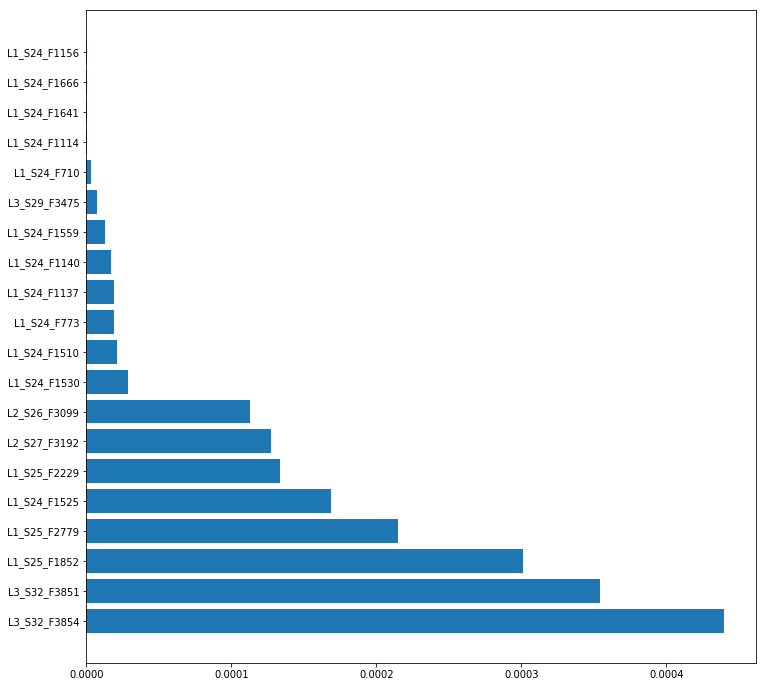

In [11]:
plt.figure(figsize=(12,12))
plt.barh(range(20), abs(np.sort(-rf_model.feature_importances_[:20])), align='center')
plt.yticks(range(20), X_train.columns[np.argsort(-rf_model.feature_importances_)][:20])

### L3_S32_F3854 がなんか高そう。詳細見てみる。

In [18]:
s32_ok = df[df['Response']==0].L3_S32_F3854
s32_ng = df[df['Response']==1].L3_S32_F3854




In [26]:
print(s32_ok.value_counts())
print(s32_ng.value_counts())

 0.000000e+00    1156373
 1.280000e+02       4497
 2.000000e+00       3469
 1.600000e+01       3350
 8.000000e+00       2772
 5.120000e+02       1470
 2.560000e+02       1243
-2.147484e+09        627
 4.800000e+01        521
 4.000000e+00        516
 1.000000e+00        516
-2.147483e+09        384
-2.147482e+09        371
-2.147483e+09        363
-2.147487e+07        115
 1.152000e+03        103
 3.699200e+04         38
 3.289600e+04         37
-2.147482e+09         34
 1.310000e+03         26
-2.147482e+07         12
 6.553600e+04          6
 3.200000e+01          6
-2.147482e+07          5
 4.920000e+02          4
 1.651200e+04          3
 6.361600e+04          2
 2.400000e+01          2
 5.542400e+04          1
 6.400000e+01          1
-2.147482e+09          1
Name: L3_S32_F3854, dtype: int64
 0.000000e+00    5792
 2.000000e+00     667
 1.600000e+01     159
 4.000000e+00     156
 4.800000e+01      35
 1.280000e+02      31
 8.000000e+00      15
 5.120000e+02       9
 2.560000e+02   

In [28]:
# うーむ、、、特徴がみえない。
# category ってそもそもなんの値なのだろう？

In [37]:
category = df.drop('Id', axis=1).drop('Unnamed: 0', axis=1)

In [ ]:
 category.shape

In [44]:
cat_changed = category.loc[0!=category.sum(), :]

MemoryError: 

MemoryError: 

In [46]:
category.sum(axis=0)

Response         6879.0
L0_S1_F25          25.0
L0_S1_F27         225.0
L0_S1_F29          27.0
L0_S1_F31         297.0
L0_S2_F33         263.0
L0_S2_F35       13076.0
L0_S2_F37         263.0
L0_S2_F39       13076.0
L0_S2_F41         263.0
L0_S2_F43       13076.0
L0_S2_F45         263.0
L0_S2_F47       13076.0
L0_S2_F49         263.0
L0_S2_F51       13076.0
L0_S2_F53         263.0
L0_S2_F55       13076.0
L0_S2_F57         263.0
L0_S2_F59       13076.0
L0_S2_F61         263.0
L0_S2_F63       13076.0
L0_S2_F65         263.0
L0_S2_F67       13076.0
L0_S3_F69           0.0
L0_S3_F71           0.0
L0_S3_F73           0.0
L0_S3_F75           0.0
L0_S3_F77           0.0
L0_S3_F79           0.0
L0_S3_F81           0.0
                 ...   
L3_S47_F4179        0.0
L3_S47_F4181    59955.0
L3_S47_F4182        0.0
L3_S47_F4184        0.0
L3_S47_F4186    59955.0
L3_S47_F4187        0.0
L3_S47_F4189        0.0
L3_S47_F4191    59955.0
L3_S47_F4192        0.0
L3_S49_F4207       33.0
L3_S49_F4209    